<a href="https://colab.research.google.com/github/pxs1990/complete_classification_algorithm_DS/blob/main/Classification_Algorithm_Customer_Churn_dummies.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **1) Importing Basic Libraries**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# **2) Importing dataset**

In [ ]:
df = pd.read_csv('/content/BankChurners.csv')
df.head(2)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45.0,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49.0,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105


# **3) Dataset exploration:**

In [ ]:
# Checking the number of rows and columns in the data
df.shape

(10127, 21)

#The dataset has 10127 rows and 23 columns.

In [ ]:
# let's create a copy of the data
data = df.copy()

In [ ]:
data.isnull().sum()

CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                5
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

#We can see that Customer_Age  column has 5 null values i.e. column has missing values.

# **4) Exploratory Data Analysis (EDA)**

In [ ]:
# let's check the data types of the columns in the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10122 non-null  float64
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  object 
 6   Marital_Status            10127 non-null  object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [ ]:
# let's check for duplicate values in the data
data.duplicated().sum()

0

In [ ]:
duplicate_rows = data[data.duplicated(subset = ['CLIENTNUM','Gender', 'Education_Level'], keep = False)]
duplicate_rows.count()

CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [ ]:
# print uniques
data.nunique()

CLIENTNUM                   10127
Attrition_Flag                  2
Customer_Age                   45
Gender                          2
Dependent_count                 6
Education_Level                 7
Marital_Status                  4
Income_Category                 6
Card_Category                   4
Months_on_book                 44
Total_Relationship_Count        6
Months_Inactive_12_mon          7
Contacts_Count_12_mon           7
Credit_Limit                 6205
Total_Revolving_Bal          1974
Avg_Open_To_Buy              6813
Total_Amt_Chng_Q4_Q1         1158
Total_Trans_Amt              5033
Total_Trans_Ct                126
Total_Ct_Chng_Q4_Q1           830
Avg_Utilization_Ratio         964
dtype: int64

In [ ]:
# print uniques
data['Attrition_Flag'].unique()

array(['Existing Customer', 'Attrited Customer'], dtype=object)

In [ ]:
# print nuniques
data['Attrition_Flag'].nunique()

2

In [ ]:
#It gives the total number of rows including the null and not-null values
data.isnull().count()

CLIENTNUM                   10127
Attrition_Flag              10127
Customer_Age                10127
Gender                      10127
Dependent_count             10127
Education_Level             10127
Marital_Status              10127
Income_Category             10127
Card_Category               10127
Months_on_book              10127
Total_Relationship_Count    10127
Months_Inactive_12_mon      10127
Contacts_Count_12_mon       10127
Credit_Limit                10127
Total_Revolving_Bal         10127
Avg_Open_To_Buy             10127
Total_Amt_Chng_Q4_Q1        10127
Total_Trans_Amt             10127
Total_Trans_Ct              10127
Total_Ct_Chng_Q4_Q1         10127
Avg_Utilization_Ratio       10127
dtype: int64

In [ ]:
data.count() # It gives only the number of not-null values.

CLIENTNUM                   10127
Attrition_Flag              10127
Customer_Age                10122
Gender                      10127
Dependent_count             10127
Education_Level             10127
Marital_Status              10127
Income_Category             10127
Card_Category               10127
Months_on_book              10127
Total_Relationship_Count    10127
Months_Inactive_12_mon      10127
Contacts_Count_12_mon       10127
Credit_Limit                10127
Total_Revolving_Bal         10127
Avg_Open_To_Buy             10127
Total_Amt_Chng_Q4_Q1        10127
Total_Trans_Amt             10127
Total_Trans_Ct              10127
Total_Ct_Chng_Q4_Q1         10127
Avg_Utilization_Ratio       10127
dtype: int64

In [ ]:
data.isnull().sum() # It gives only the null(missing) values.

CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                5
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [ ]:
# let's check for missing values in the data
round(data.isnull().sum() / data.isnull().count() * 100, 2)

CLIENTNUM                   0.00
Attrition_Flag              0.00
Customer_Age                0.05
Gender                      0.00
Dependent_count             0.00
Education_Level             0.00
Marital_Status              0.00
Income_Category             0.00
Card_Category               0.00
Months_on_book              0.00
Total_Relationship_Count    0.00
Months_Inactive_12_mon      0.00
Contacts_Count_12_mon       0.00
Credit_Limit                0.00
Total_Revolving_Bal         0.00
Avg_Open_To_Buy             0.00
Total_Amt_Chng_Q4_Q1        0.00
Total_Trans_Amt             0.00
Total_Trans_Ct              0.00
Total_Ct_Chng_Q4_Q1         0.00
Avg_Utilization_Ratio       0.00
dtype: float64

In [ ]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.0,7.391776e+08,3.690378e+07,708082083.0,7.130368e+08,7.179264e+08,7.731435e+08,8.283431e+08
Customer_Age,10122.0,4.632464e+01,8.016195e+00,26.0,4.100000e+01,4.600000e+01,5.200000e+01,7.300000e+01
Dependent_count,10127.0,2.346203e+00,1.298908e+00,0.0,1.000000e+00,2.000000e+00,3.000000e+00,5.000000e+00
Months_on_book,10127.0,3.592841e+01,7.986416e+00,13.0,3.100000e+01,3.600000e+01,4.000000e+01,5.600000e+01
Total_Relationship_Count,10127.0,3.812580e+00,1.554408e+00,1.0,3.000000e+00,4.000000e+00,5.000000e+00,6.000000e+00
Months_Inactive_12_mon,10127.0,2.341167e+00,1.010622e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Contacts_Count_12_mon,10127.0,2.455317e+00,1.106225e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Credit_Limit,10127.0,8.631954e+03,9.088777e+03,1438.3,2.555000e+03,4.549000e+03,1.106750e+04,3.451600e+04
Total_Revolving_Bal,10127.0,1.162814e+03,8.149873e+02,0.0,3.590000e+02,1.276000e+03,1.784000e+03,2.517000e+03
Avg_Open_To_Buy,10127.0,7.469140e+03,9.090685e+03,3.0,1.324500e+03,3.474000e+03,9.859000e+03,3.451600e+04


In [ ]:
# let's view the statistical summary of the non-numerical columns in the data
data.describe(exclude=np.number).T

,count,unique,top,freq
Attrition_Flag,10127,2,Existing Customer,8500
Gender,10127,2,F,5358
Education_Level,10127,7,Graduate,3128
Marital_Status,10127,4,Married,4687
Income_Category,10127,6,Less than $40K,3561
Card_Category,10127,4,Blue,9436


In [ ]:
# Create a crosstab of Income_Category  and Card_Category
cross_tab = pd.crosstab(data['Income_Category'], data['Card_Category'])

print(cross_tab)

Card_Category    Blue  Gold  Platinum  Silver
Income_Category                              
$120K +           645    18         4      60
$40K - $60K      1675    15         1      99
$60K - $80K      1273    29         4      96
$80K - $120K     1395    21         2     117
Less than $40K   3403    24         4     130
Unknown          1045     9         5      53


In [ ]:
duplicate_rows = data[data.duplicated(subset = ['CLIENTNUM','Gender', 'Education_Level'], keep = False)]
duplicate_rows.count()

CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [ ]:
pd.pivot_table(data, index = "Income_Category",columns = 'Gender', values = 'Credit_Limit',  aggfunc = 'mean',fill_value = data["Credit_Limit"].mean())

Gender,F,M
Income_Category,,
$120K +,8631.953698,19717.322558
$40K - $60K,4813.705227,6309.726804
$60K - $80K,8631.953698,10758.772967
$80K - $120K,8631.953698,15809.890945
Less than $40K,3684.819945,4579.371119
Unknown,9373.363585,12436.044231


In [ ]:
#pd.pivot_table(data,values = 'Credit_Limit', index = "Income_Category", columns = 'Gender', aggfunc = 'mean',fill_value = data["Credit_Limit"].median())

#Data Cleaning:

Here, one can drop the column - CLIENTNUM, as it is the unique number for each customer and will not add any value to the model.

In [ ]:
# Dropping column - ID
data.drop(columns=["CLIENTNUM"], inplace=True)

In [ ]:
data

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45.0,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49.0,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51.0,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40.0,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40.0,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,Existing Customer,50.0,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,Attrited Customer,41.0,M,2,Unknown,Divorced,$40K - $60K,Blue,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,Attrited Customer,44.0,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,Attrited Customer,30.0,M,2,Graduate,Unknown,$40K - $60K,Blue,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


# Working on Categorical columns:

In [ ]:
# Making a list of all catrgorical variables
cat_col = data.select_dtypes("object").columns.to_list()
cat_col

['Attrition_Flag',
 'Gender',
 'Education_Level',
 'Marital_Status',
 'Income_Category',
 'Card_Category']

In [ ]:
# Printing number of count of each unique value in each column
for column in cat_col:
    print(data[column].value_counts())
    print("*" * 50) # printing 50 *** after each iteration

Existing Customer    8500
Attrited Customer    1627
Name: Attrition_Flag, dtype: int64
**************************************************
F    5358
M    4769
Name: Gender, dtype: int64
**************************************************
Graduate         3128
High School      2013
Unknown          1519
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64
**************************************************
Married     4687
Single      3943
Unknown      749
Divorced     748
Name: Marital_Status, dtype: int64
**************************************************
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: Income_Category, dtype: int64
**************************************************
Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64
******************************************

In [ ]:
# Get value counts
df["Attrition_Flag"].value_counts(normalize=True)

Existing Customer    0.83934
Attrited Customer    0.16066
Name: Attrition_Flag, dtype: float64

The analysis shows that there are more female customers as compared to male customers.

There is a few observations of Platinum Card holders (20). So, we can merge those number with the "Gold" card category.

Importantly, one can see that the distribution of classes in the target variable is imbalanced i.e. only ~16% observations with existing customers (non-attritees).

#Replace incorrect data entry values with an imputed mode.

#Income Category

In [ ]:
# subset to view incorrect values
data[data.Income_Category == "Unknown"]

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
19,Existing Customer,45.0,F,2,Graduate,Married,Unknown,Blue,37,6,1,2,14470.0,1157,13313.0,0.966,1207,21,0.909,0.080
28,Existing Customer,NaN,F,3,Uneducated,Single,Unknown,Blue,34,5,2,2,10100.0,0,10100.0,0.525,1052,18,1.571,0.000
39,Attrited Customer,66.0,F,0,Doctorate,Married,Unknown,Blue,56,5,4,3,7882.0,605,7277.0,1.052,704,16,0.143,0.077
44,Existing Customer,38.0,F,4,Graduate,Single,Unknown,Blue,28,2,3,3,9830.0,2055,7775.0,0.977,1042,23,0.917,0.209
58,Existing Customer,44.0,F,5,Graduate,Married,Unknown,Blue,35,4,1,2,6273.0,978,5295.0,2.275,1359,25,1.083,0.156
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10021,Attrited Customer,30.0,F,1,Graduate,Married,Unknown,Blue,18,4,1,4,4377.0,2517,1860.0,0.941,8759,74,0.609,0.575
10040,Attrited Customer,50.0,F,3,Doctorate,Single,Unknown,Blue,36,4,3,3,5173.0,0,5173.0,0.912,8757,68,0.789,0.000
10083,Existing Customer,42.0,F,4,Uneducated,Married,Unknown,Blue,23,4,1,2,8348.0,0,8348.0,0.695,15905,111,0.708,0.000
10092,Attrited Customer,40.0,F,3,Graduate,Married,Unknown,Blue,25,1,2,3,6888.0,1878,5010.0,1.059,9038,64,0.829,0.273


In [ ]:
# replace  missing values ( unKnown values) with nan
data.Income_Category.replace(to_replace="Unknown", value=np.nan, inplace=True)

In [ ]:
# subset to view incorrect values
data[data.Income_Category == "Unknown"]

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio


In [ ]:
'Unknown' in data["Income_Category"] # Another way of checking unknown values in the Income_category column

False

In [ ]:
# checking value replacement
data.Income_Category.value_counts()

Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
$120K +            727
Name: Income_Category, dtype: int64

In [ ]:
# imputing NaN by the mode of Income_Category onto missing values
data.Income_Category = data.Income_Category.fillna(
    value=data["Income_Category"].value_counts().index[0])
data.Income_Category

0           $60K - $80K
1        Less than $40K
2          $80K - $120K
3        Less than $40K
4           $60K - $80K
              ...      
10122       $40K - $60K
10123       $40K - $60K
10124    Less than $40K
10125       $40K - $60K
10126    Less than $40K
Name: Income_Category, Length: 10127, dtype: object

In [ ]:
# checking to see value replacement
data.Income_Category.value_counts()

Less than $40K    4673
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
$120K +            727
Name: Income_Category, dtype: int64

#EDUCATION_LEVEL:


In [ ]:
# subset to view incorrect values
data[data.Education_Level == "Unknown"]

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
6,Existing Customer,51.0,M,4,Unknown,Married,$120K +,Gold,46,6,1,3,34516.0,2264,32252.0,1.975,1330,31,0.722,0.066
11,Existing Customer,65.0,M,1,Unknown,Married,$40K - $60K,Blue,54,6,2,3,9095.0,1587,7508.0,1.433,1314,26,1.364,0.174
15,Existing Customer,44.0,M,4,Unknown,Unknown,$80K - $120K,Blue,37,5,1,2,4234.0,972,3262.0,1.707,1348,27,1.700,0.230
17,Existing Customer,41.0,M,3,Unknown,Married,$80K - $120K,Blue,34,4,4,1,13535.0,1291,12244.0,0.653,1028,21,1.625,0.095
23,Existing Customer,47.0,F,4,Unknown,Single,Less than $40K,Blue,36,3,3,2,2492.0,1560,932.0,0.573,1126,23,0.353,0.626
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10090,Existing Customer,36.0,F,3,Unknown,Married,$40K - $60K,Blue,22,5,3,3,12958.0,2273,10685.0,0.608,15681,96,0.627,0.175
10094,Existing Customer,59.0,M,1,Unknown,Single,$60K - $80K,Blue,48,3,1,2,7288.0,0,7288.0,0.640,14873,120,0.714,0.000
10095,Existing Customer,46.0,M,3,Unknown,Married,$80K - $120K,Blue,33,4,1,3,34516.0,1099,33417.0,0.816,15490,110,0.618,0.032
10118,Attrited Customer,50.0,M,1,Unknown,Unknown,$80K - $120K,Blue,36,6,3,4,9959.0,952,9007.0,0.825,10310,63,1.100,0.096


In [ ]:
# replace  missing values ( unKnown values) with nan
data.Education_Level.replace(to_replace="Unknown", value=np.nan, inplace=True)

In [ ]:
# subset to view incorrect values
data[data.Income_Category == "Unknown"]

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio


In [ ]:
data['Education_Level'].value_counts()

Graduate         3128
High School      2013
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64

In [ ]:
data.Education_Level.isnull().count()

10127

In [ ]:
data.Education_Level.unique()

array(['High School', 'Graduate', 'Uneducated', nan, 'College',
       'Post-Graduate', 'Doctorate'], dtype=object)

In [ ]:
data.Education_Level.isnull().sum()

1519

In [ ]:
# imputing NaN by the mode of Income_Category onto missing values
data.Education_Level = data.Education_Level.fillna(
    value=data['Education_Level'].value_counts().index[1])
data.Education_Level

0        High School
1           Graduate
2           Graduate
3        High School
4         Uneducated
            ...     
10122       Graduate
10123    High School
10124    High School
10125       Graduate
10126       Graduate
Name: Education_Level, Length: 10127, dtype: object

In [ ]:
# check value replacement
data.Education_Level.value_counts()

High School      3532
Graduate         3128
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64

In [ ]:
data.Education_Level.isnull().sum()

0

#'Marital_Status'

In [ ]:
# subset to view incorrect values
data[data.Marital_Status == "Unknown"]

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
3,Existing Customer,40.0,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
7,Existing Customer,32.0,M,0,High School,Unknown,$60K - $80K,Silver,27,2,2,2,29081.0,1396,27685.0,2.204,1538,36,0.714,0.048
10,Existing Customer,42.0,M,5,Uneducated,Unknown,$120K +,Blue,31,5,3,2,6748.0,1467,5281.0,0.831,1201,42,0.680,0.217
13,Existing Customer,35.0,M,3,Graduate,Unknown,$60K - $80K,Blue,30,5,1,3,8547.0,1666,6881.0,1.163,1311,33,2.000,0.195
15,Existing Customer,44.0,M,4,High School,Unknown,$80K - $120K,Blue,37,5,1,2,4234.0,972,3262.0,1.707,1348,27,1.700,0.230
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10070,Existing Customer,47.0,M,3,High School,Unknown,$80K - $120K,Silver,40,5,3,2,34516.0,1371,33145.0,0.691,15930,123,0.836,0.040
10100,Existing Customer,39.0,M,2,Graduate,Unknown,$60K - $80K,Silver,36,4,2,2,29808.0,0,29808.0,0.669,16098,128,0.684,0.000
10101,Existing Customer,42.0,M,2,Graduate,Unknown,$40K - $60K,Blue,30,3,2,5,3735.0,1723,2012.0,0.595,14501,92,0.840,0.461
10118,Attrited Customer,50.0,M,1,High School,Unknown,$80K - $120K,Blue,36,6,3,4,9959.0,952,9007.0,0.825,10310,63,1.100,0.096


In [ ]:
# replace  missing values ( unKnown values) with nan
data.Marital_Status.replace(to_replace="Unknown", value=np.nan, inplace=True)

In [ ]:
# check value replacement
data.Marital_Status.value_counts()  # it only counts the non-null values...

Married     4687
Single      3943
Divorced     748
Name: Marital_Status, dtype: int64

In [ ]:
data[data.Marital_Status == "Unknown"]

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio


In [ ]:
# imputing NaN by the mode of Income_Category onto missing values
data.Marital_Status = data.Marital_Status.fillna(
    value=data['Marital_Status'].value_counts().index[0])
data.Marital_Status

0         Married
1          Single
2         Married
3         Married
4         Married
           ...   
10122      Single
10123    Divorced
10124     Married
10125     Married
10126     Married
Name: Marital_Status, Length: 10127, dtype: object

In [ ]:
# check value replacement
data.Marital_Status.value_counts()

Married     5436
Single      3943
Divorced     748
Name: Marital_Status, dtype: int64

In [ ]:
data['Marital_Status'].isnull().sum()

0

#Card_Category

In [ ]:
data['Card_Category'].replace({'Gold': "Premium", "Platinum": "Premium"}, inplace = True)
data['Card_Category'].value_counts()

Blue       9436
Silver      555
Premium     136
Name: Card_Category, dtype: int64

# 'Customer_Age': Imputation

In [ ]:
data['Customer_Age'] = data['Customer_Age'].fillna(value = data['Customer_Age'].mean())

In [ ]:
from sklearn.impute import SimpleImputer # sklearn--library, impute= API, CLASS = SimpleImputer



imputer = SimpleImputer(missing_values = np.nan, strategy = 'mean')
data['Customer_Age'] = imputer.fit_transform(data['Customer_Age'].values.reshape(-1,1))
data.Customer_Age.isnull().sum()

0

In [ ]:
data['Customer_Age'].isnull().sum()

0

#Visualization:

In [ ]:
data.columns

Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  float64
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

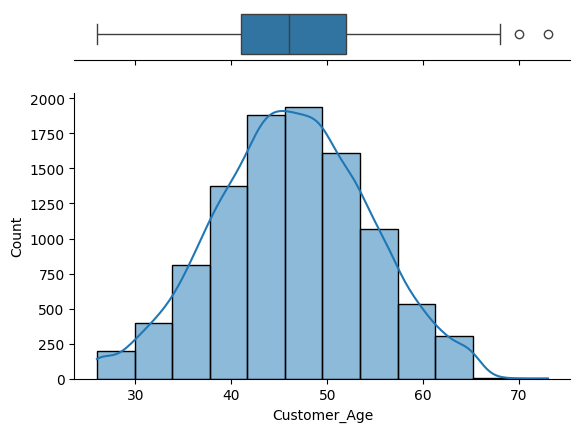

In [ ]:
import seaborn as sns
x = data['Customer_Age']

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})

sns.boxplot(x=x, ax=ax_box)
sns.histplot(x=x, bins=12, kde=True, stat='count', ax=ax_hist)

ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

The distribution of age is normal.

The boxplot shows that there are outliers at the right end.

We will not treat these outliers as they represent the real market trend.

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  float64
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

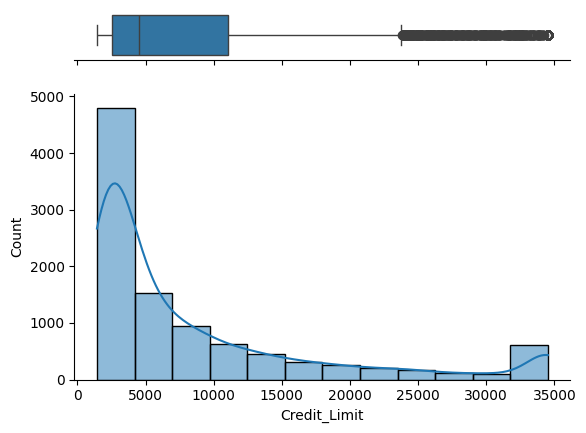

In [ ]:
import seaborn as sns
x = data['Credit_Limit']

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})

sns.boxplot(x=x, ax=ax_box)
sns.histplot(x=x, bins=12, kde=True, stat='count', ax=ax_hist)

ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

The distribution of the credit amount is right-skewed.

The boxplot shows that there are outliers at the right end.

We will not treat these outliers as they represent the real market trend.

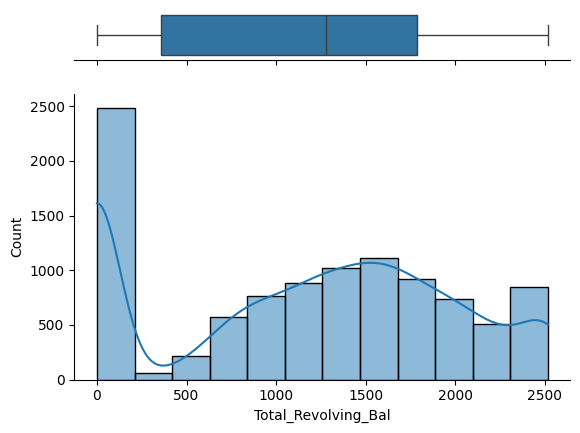

In [ ]:
import seaborn as sns
x = data['Total_Revolving_Bal']

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})

sns.boxplot(x=x, ax=ax_box)
sns.histplot(x=x, bins=12, kde=True, stat='count', ax=ax_hist)

ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

The distribution of the balance that carries over from one month to the next is the revolving balance for which the credit is given is somewhat normal.

The boxplot shows that there are outliers at the left end.

We will not treat these outliers as they represent the real market trend.

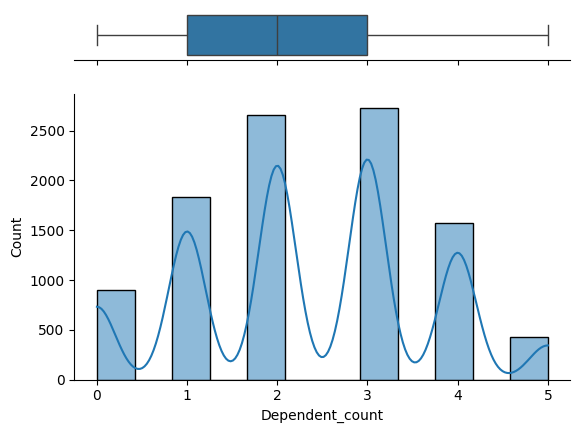

In [ ]:
import seaborn as sns
x = data['Dependent_count']

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})

sns.boxplot(x=x, ax=ax_box)
sns.histplot(x=x, bins=12, kde=True, stat='count', ax=ax_hist)

ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

In [ ]:
data['Attrition_Flag'].unique()

array(['Existing Customer', 'Attrited Customer'], dtype=object)

#Categorical: Univariate

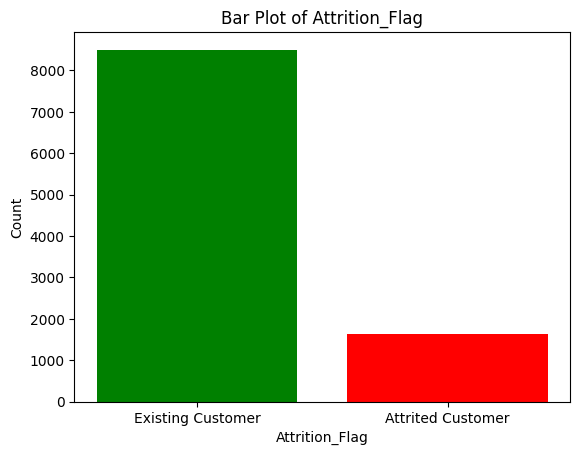

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

Attrition_Flag_counts = data['Attrition_Flag'].value_counts()

plt.bar(Attrition_Flag_counts.index, Attrition_Flag_counts, color=['green', 'red'])

# Add labels and title
plt.xlabel('Attrition_Flag')
plt.ylabel('Count')
plt.title('Bar Plot of Attrition_Flag')

plt.show()

In [ ]:
data.columns


Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

In [ ]:
data['Education_Level'].unique()

array(['High School', 'Graduate', 'Uneducated', 'College',
       'Post-Graduate', 'Doctorate'], dtype=object)

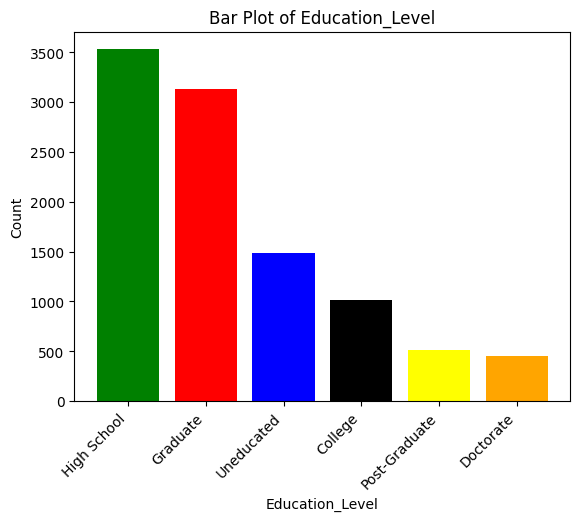

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

Education_Level_counts = data['Education_Level'].value_counts()

plt.bar(Education_Level_counts.index, Education_Level_counts, color=['green', 'red','blue', 'black', 'yellow', 'orange'])

# Add labels and title
plt.xlabel('Education_Level')
plt.ylabel('Count')
plt.title('Bar Plot of Education_Level')
# Rotate x-axis labels
plt.xticks(rotation=45, ha = 'right')
plt.show()

#Bivariate Analysis:

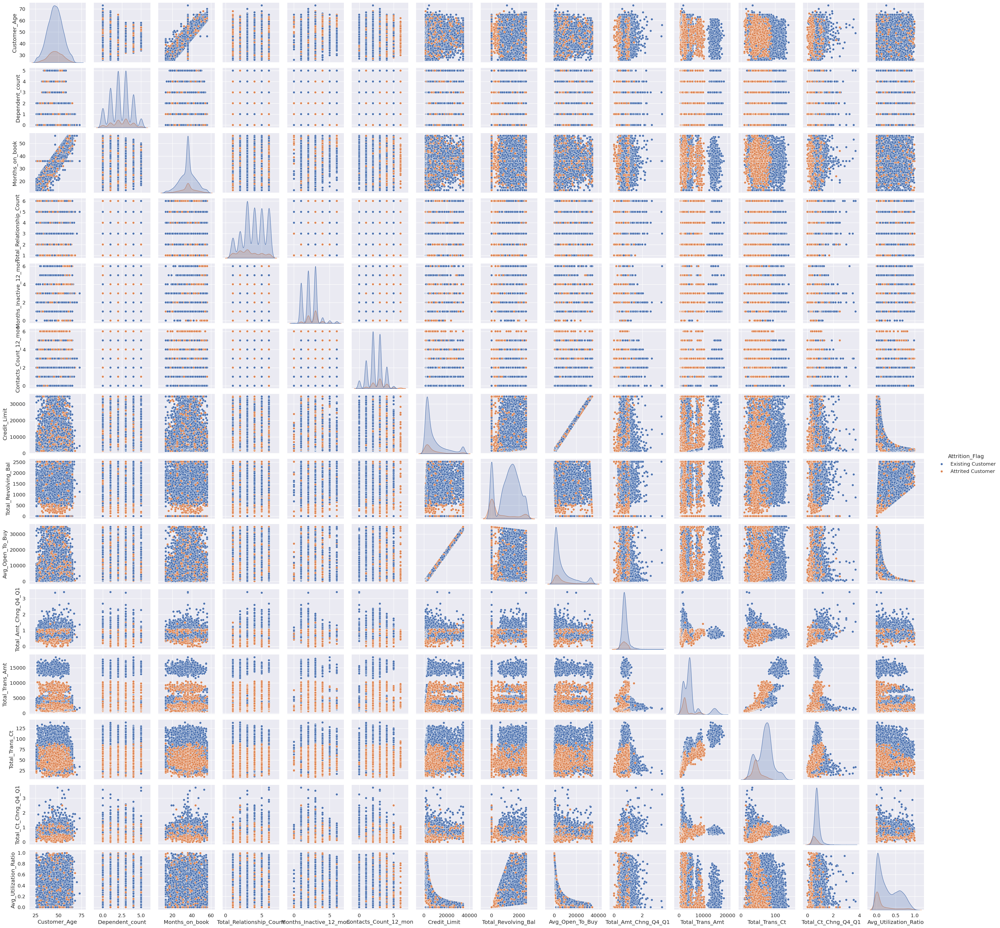

In [ ]:
# seaborn pairplot
sns.pairplot(data, hue="Attrition_Flag")

#Further explore of bivariate analysis one-by-one:

<Axes: xlabel='Attrition_Flag', ylabel='Customer_Age'>

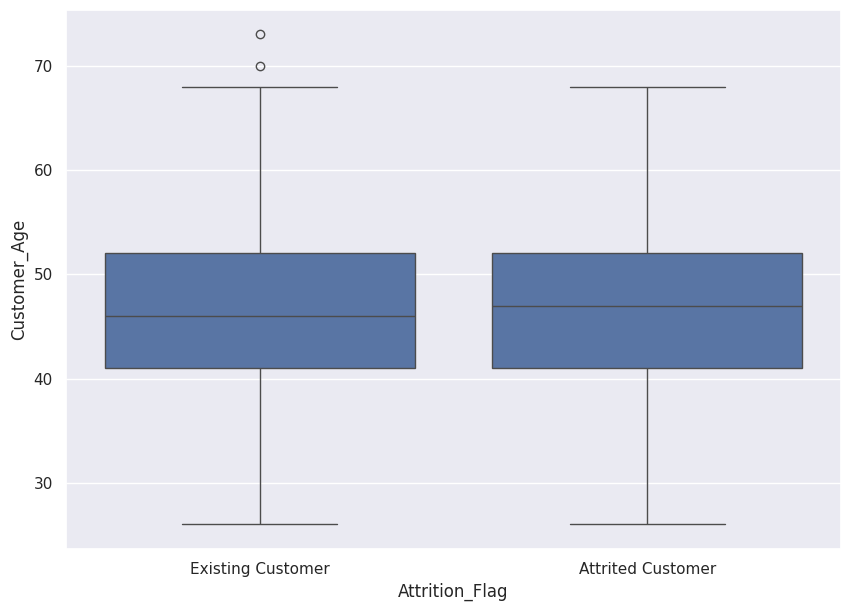

In [ ]:
# box plots on 2 variables
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Customer_Age", data=data, orient="vertical")

We can see that the median age of attritees is higher than the median age of non-attritees.

This shows that younger customers are more likely to stay as customers.

There are outliers in boxplots of only existing customers.

<Axes: xlabel='Customer_Age', ylabel='Proportion'>

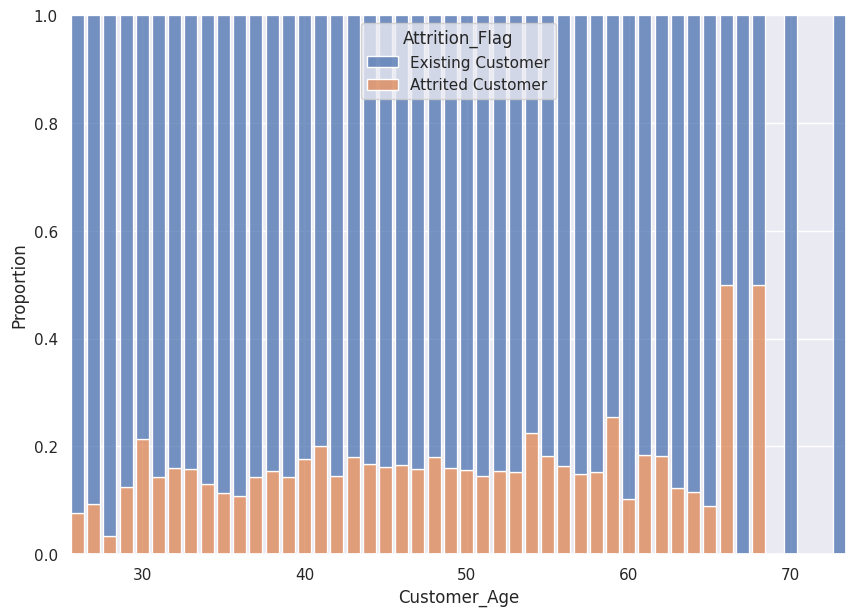

In [ ]:

sns.histplot(
    data=data,
    x="Customer_Age", hue="Attrition_Flag",
    multiple="fill", stat="proportion",
    discrete=True, shrink=.8)

We see how older customers tend to be existing customers. Younger people might be more prone to looking for new and better credit options.

40-year-olds take up the majority of the dataset.

43 - 48 year olds tended to attrite.

<Axes: xlabel='Card_Category', ylabel='Proportion'>

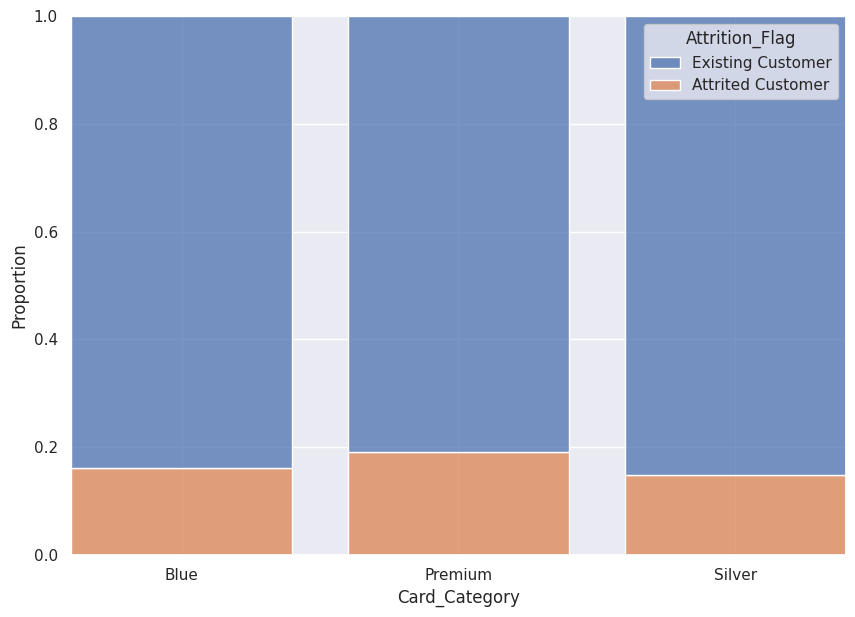

In [ ]:

sns.histplot(
    data=data,
    x="Card_Category", hue="Attrition_Flag",
    multiple="fill", stat="proportion",
    discrete=True, shrink=.8)

Customers owning a Silver or Blue card are less likely to attrit.

Customers with Platinum or Gold ( premium) cards are more likley to attrit.

In [ ]:
# plot correlation matrix: Heatmap

<ipython-input-68-090e6599ce82>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")


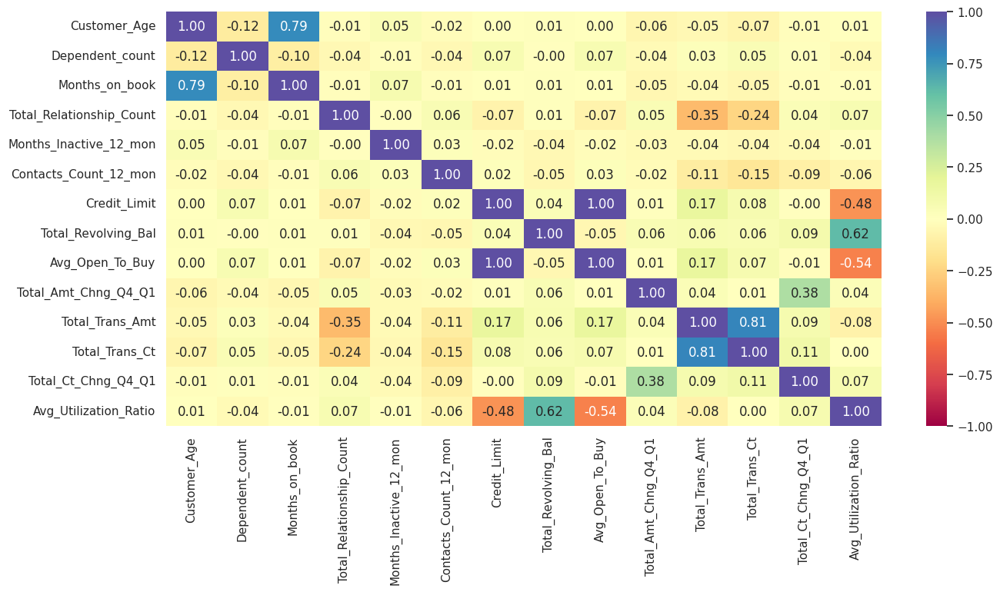

In [ ]:
# plot correlation matrix
plt.figure(figsize=(15, 7))
sns.heatmap(data.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

Total_Trans_Ct is highly correlated with Total_Trans_Amt which makes sense since both are related to the transactions of the credit card holder.

Months_on_book is related to Customer_Age which makes some sense since older customers would have more time on the banks books.

Avg_Utilization_Ratio has a correlation with Total_Revolving_Bal which makes sense since both are related to blaance.

Other variables have no significant correlation between them.

## **Data preprocessing for modelling:**


In [ ]:
# Separating target variable and other variables
X = data.drop(columns="Attrition_Flag")
# make dependent variable
y = data["Attrition_Flag"]

# check head
X.head()

,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,45.0,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,49.0,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,51.0,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,40.0,F,4,High School,Married,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,40.0,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [ ]:
y.head()

0    Existing Customer
1    Existing Customer
2    Existing Customer
3    Existing Customer
4    Existing Customer
Name: Attrition_Flag, dtype: object

## **Splitting data into training, validation and test set:**

In [ ]:
from sklearn.model_selection import train_test_split

# X_temp, X_test, y_temp, y_test = train_test_split(X, y, test_size=0.20, random_state=1, stratify=y)
# X_train, X_val, y_train, y_val = train_test_split(X_temp,y_temp,test_size=0.25,random_state=2,stratify=y_temp)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1, stratify=y)

print(X_train.shape,  X_test.shape)

(8101, 19) (2026, 19)


In [ ]:
X_train.head()

,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
9500,46.0,M,2,High School,Single,$40K - $60K,Blue,32,2,3,2,5972.0,0,5972.0,0.606,14227,116,0.706,0.000
8586,53.0,M,3,Graduate,Single,$120K +,Premium,43,3,1,3,34516.0,2435,32081.0,0.770,7758,98,0.719,0.071
7391,41.0,F,3,Uneducated,Married,$40K - $60K,Blue,36,1,3,4,3606.0,0,3606.0,0.370,1829,41,0.519,0.000
6822,40.0,M,3,Graduate,Single,$80K - $120K,Blue,36,1,2,2,6921.0,0,6921.0,0.824,2729,44,0.467,0.000
2707,42.0,M,5,High School,Married,$60K - $80K,Blue,35,6,3,2,13650.0,1253,12397.0,0.743,1703,53,0.710,0.092


# Feature Scaling:
Let's create a group of columns/independent variables for which the feature scaling is designed...

In [ ]:
# Encode categorical columns from the X_train, X_val,X_test
categorical_df1 = X_train.select_dtypes(include=['object'])
categorical_df2 = X_test.select_dtypes(include=['object'])

In [ ]:
# set dummy variables: Similar to the One hot
cat_ohe1 = pd.get_dummies(categorical_df1, categorical_df1.columns,drop_first=True)
cat_ohe2 = pd.get_dummies(categorical_df2, categorical_df2.columns,drop_first=True)


In [ ]:
cat_ohe1.head(5)

,Gender_M,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Marital_Status_Married,Marital_Status_Single,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Card_Category_Premium,Card_Category_Silver
9500,1,0,0,1,0,0,0,1,1,0,0,0,0,0
8586,1,0,1,0,0,0,0,1,0,0,0,0,1,0
7391,0,0,0,0,0,1,1,0,1,0,0,0,0,0
6822,1,0,1,0,0,0,0,1,0,0,1,0,0,0
2707,1,0,0,1,0,0,1,0,0,1,0,0,0,0


In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

# Standardize numeric columns from the X_train, X_val,X_test
numeric_df1 = X_train.select_dtypes(exclude=['object'])
numeric_df2 = X_test.select_dtypes(exclude=['object'])

numeric_df11 = scaler.fit_transform(numeric_df1)#array
numeric_df22 = scaler.transform(numeric_df2)

# Convert the standardized arrays back to DataFrames
numeric_df1_scaled = pd.DataFrame(numeric_df11, columns=numeric_df1.columns, index=numeric_df1.index)
numeric_df2_scaled = pd.DataFrame(numeric_df22, columns=numeric_df2.columns, index=numeric_df2.index)

In [ ]:
numeric_df1_scaled

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
9500,-0.043373,-0.260188,-0.490956,-1.166725,0.664344,-0.413463,-0.291946,-1.413872,-0.164462,-0.692924,2.897821,2.180118,-0.025373,-0.992603
8586,0.826549,0.505165,0.881967,-0.522529,-1.328196,0.492042,2.852836,1.563818,2.710240,0.047904,0.992029,1.414263,0.029154,-0.734787
7391,-0.664745,0.505165,0.008289,-1.810921,0.664344,1.397547,-0.552616,-1.413872,-0.424967,-1.758994,-0.754678,-1.010946,-0.809715,-0.992603
6822,-0.789019,0.505165,0.008289,-1.810921,-0.331926,-0.413463,-0.187392,-1.413872,-0.059973,0.291835,-0.489535,-0.883304,-1.027820,-0.992603
2707,-0.540470,2.035872,-0.116522,1.410058,0.664344,-0.413463,0.553963,0.118385,0.542956,-0.074061,-0.791798,-0.500376,-0.008595,-0.658532
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
509,-0.167647,0.505165,0.008289,-0.522529,0.664344,0.492042,-0.506123,-0.545634,-0.456677,-0.128268,-1.060477,-1.819349,0.507309,-0.353511
1458,-1.286117,-0.260188,-0.740578,0.121666,-0.331926,1.397547,-0.772962,-0.438022,-0.733038,-0.765200,-0.636836,-0.840756,1.396509,0.812106
9509,1.447921,0.505165,1.506023,-1.166725,-1.328196,-0.413463,-0.552947,0.377633,-0.586600,-0.584510,2.900178,1.541905,-0.235090,0.485298
6113,-1.410391,-1.025542,-1.489445,0.765862,0.664344,0.492042,-0.791438,-1.413872,-0.663640,0.404767,-0.599716,-0.755661,-0.608386,-0.992603


In [ ]:
X_train =pd.concat([cat_ohe1,numeric_df1_scaled], axis=1)
X_test =pd.concat([cat_ohe2,numeric_df2_scaled], axis=1)

In [ ]:
print(X_train.shape,  X_test.shape)

(8101, 28) (2026, 28)


In [ ]:
y_train=y_train.map({'Attrited Customer':1,'Existing Customer':0 })
y_test=y_test.map({'Attrited Customer':1,'Existing Customer':0 })

In [ ]:
print(y_train.shape,y_test.shape)

(8101,) (2026,)


In [ ]:
y_train.value_counts()

0    6799
1    1302
Name: Attrition_Flag, dtype: int64

In [ ]:
# print percentage of each unique value in the Y series
print(y_train.value_counts()/len(y_train))
print(y_test.value_counts()/len(y_test))

0    0.839279
1    0.160721
Name: Attrition_Flag, dtype: float64
0    0.839585
1    0.160415
Name: Attrition_Flag, dtype: float64


In [ ]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8101 entries, 9500 to 10034
Data columns (total 28 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender_M                        8101 non-null   uint8  
 1   Education_Level_Doctorate       8101 non-null   uint8  
 2   Education_Level_Graduate        8101 non-null   uint8  
 3   Education_Level_High School     8101 non-null   uint8  
 4   Education_Level_Post-Graduate   8101 non-null   uint8  
 5   Education_Level_Uneducated      8101 non-null   uint8  
 6   Marital_Status_Married          8101 non-null   uint8  
 7   Marital_Status_Single           8101 non-null   uint8  
 8   Income_Category_$40K - $60K     8101 non-null   uint8  
 9   Income_Category_$60K - $80K     8101 non-null   uint8  
 10  Income_Category_$80K - $120K    8101 non-null   uint8  
 11  Income_Category_Less than $40K  8101 non-null   uint8  
 12  Card_Category_Premium         

#Checking Missing-Values

In [ ]:
# show missing values
X_train.isna().sum()

Gender_M                          0
Education_Level_Doctorate         0
Education_Level_Graduate          0
Education_Level_High School       0
Education_Level_Post-Graduate     0
Education_Level_Uneducated        0
Marital_Status_Married            0
Marital_Status_Single             0
Income_Category_$40K - $60K       0
Income_Category_$60K - $80K       0
Income_Category_$80K - $120K      0
Income_Category_Less than $40K    0
Card_Category_Premium             0
Card_Category_Silver              0
Customer_Age                      0
Dependent_count                   0
Months_on_book                    0
Total_Relationship_Count          0
Months_Inactive_12_mon            0
Contacts_Count_12_mon             0
Credit_Limit                      0
Total_Revolving_Bal               0
Avg_Open_To_Buy                   0
Total_Amt_Chng_Q4_Q1              0
Total_Trans_Amt                   0
Total_Trans_Ct                    0
Total_Ct_Chng_Q4_Q1               0
Avg_Utilization_Ratio       

In [ ]:
X_test.isna().sum()

Gender_M                          0
Education_Level_Doctorate         0
Education_Level_Graduate          0
Education_Level_High School       0
Education_Level_Post-Graduate     0
Education_Level_Uneducated        0
Marital_Status_Married            0
Marital_Status_Single             0
Income_Category_$40K - $60K       0
Income_Category_$60K - $80K       0
Income_Category_$80K - $120K      0
Income_Category_Less than $40K    0
Card_Category_Premium             0
Card_Category_Silver              0
Customer_Age                      0
Dependent_count                   0
Months_on_book                    0
Total_Relationship_Count          0
Months_Inactive_12_mon            0
Contacts_Count_12_mon             0
Credit_Limit                      0
Total_Revolving_Bal               0
Avg_Open_To_Buy                   0
Total_Amt_Chng_Q4_Q1              0
Total_Trans_Amt                   0
Total_Trans_Ct                    0
Total_Ct_Chng_Q4_Q1               0
Avg_Utilization_Ratio       

In [ ]:
# check for missingness in training set
np.nan in X_train#np.nan in y

False

In [ ]:
# get column count
len(X_train.T)

28

In [ ]:
X_train

,Gender_M,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Marital_Status_Married,Marital_Status_Single,Income_Category_$40K - $60K,Income_Category_$60K - $80K,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
9500,1,0,0,1,0,0,0,1,1,0,...,0.664344,-0.413463,-0.291946,-1.413872,-0.164462,-0.692924,2.897821,2.180118,-0.025373,-0.992603
8586,1,0,1,0,0,0,0,1,0,0,...,-1.328196,0.492042,2.852836,1.563818,2.710240,0.047904,0.992029,1.414263,0.029154,-0.734787
7391,0,0,0,0,0,1,1,0,1,0,...,0.664344,1.397547,-0.552616,-1.413872,-0.424967,-1.758994,-0.754678,-1.010946,-0.809715,-0.992603
6822,1,0,1,0,0,0,0,1,0,0,...,-0.331926,-0.413463,-0.187392,-1.413872,-0.059973,0.291835,-0.489535,-0.883304,-1.027820,-0.992603
2707,1,0,0,1,0,0,1,0,0,1,...,0.664344,-0.413463,0.553963,0.118385,0.542956,-0.074061,-0.791798,-0.500376,-0.008595,-0.658532
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
509,0,0,0,0,0,1,0,1,0,0,...,0.664344,0.492042,-0.506123,-0.545634,-0.456677,-0.128268,-1.060477,-1.819349,0.507309,-0.353511
1458,1,0,0,0,1,0,0,1,0,1,...,-0.331926,1.397547,-0.772962,-0.438022,-0.733038,-0.765200,-0.636836,-0.840756,1.396509,0.812106
9509,0,0,0,1,0,0,1,0,0,0,...,-1.328196,-0.413463,-0.552947,0.377633,-0.586600,-0.584510,2.900178,1.541905,-0.235090,0.485298
6113,0,0,0,1,0,0,0,0,0,0,...,0.664344,0.492042,-0.791438,-1.413872,-0.663640,0.404767,-0.599716,-0.755661,-0.608386,-0.992603


In [ ]:
y_train

9500     0
8586     0
7391     1
6822     1
2707     0
        ..
509      1
1458     0
9509     0
6113     1
10034    1
Name: Attrition_Flag, Length: 8101, dtype: int64

# **6) MODEL BUILDING:**
The model building is the easiest process in data science.There are lots of classification algorithm to go with.However, there is no certainity that this mdel or that model will perform better.Hence, we have to try different models and see which model performs better.

In [ ]:
import warnings
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math




from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    BaggingClassifier,
)
from xgboost import XGBClassifier

from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn import metrics
# To get different metric scores, and split data
from sklearn import metrics
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
)


from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split



from sklearn.preprocessing import StandardScaler

# Building and Training Models:

In [ ]:
# Define classifiers
algorithms = [
    ("LR", LogisticRegression(random_state=1, class_weight={0: 16, 1: 84}, solver='lbfgs', max_iter=1000)),
    ("DT", DecisionTreeClassifier(random_state=1, class_weight={0: 16, 1: 84})),
    ("GBC", GradientBoostingClassifier(random_state=1)),
    ("Adaboost", AdaBoostClassifier(random_state=1)),
    ("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")),
    ("Bagging", BaggingClassifier(random_state=1))
]

# Initialize lists to store results
results = []
metrics = ['Accuracy', 'Recall', 'Precision', 'F1 Score']
evaluation_df = pd.DataFrame(columns=['Model', 'Cross_Val_Score_Train', 'Train_Accuracy', 'Test_Accuracy',
                                      'Train_Recall', 'Test_Recall', 'Train_Precision', 'Test_Precision',
                                      'Train_F1', 'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'])

# Loop through classifiers
#cv_dict = {}
for name, model in algorithms:
    # Cross-validation
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)
    cv_result = cross_val_score(model, X_train, y_train.values.ravel(), scoring='recall', cv=kfold) # array
    #cv_dict[name] = cv_result # dictionary of model_name and CV_SCORE
    #cv_df = pd.DataFrame(cv_dict) # For boxplot drawing
    mean_recall = cv_result.mean()

    # Fit model
    model.fit(X_train, y_train.values.ravel())

    # Predict
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Calculate evaluation metrics
    train_accuracy = accuracy_score(y_train.values.ravel(), y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    train_recall = recall_score(y_train.values.ravel(), y_train_pred)
    test_recall = recall_score(y_test, y_test_pred)
    train_precision = precision_score(y_train.values.ravel(), y_train_pred)
    test_precision = precision_score(y_test, y_test_pred)
    train_f1 = f1_score(y_train.values.ravel(), y_train_pred)
    test_f1 = f1_score(y_test, y_test_pred)
    train_roc_auc = roc_auc_score(y_train.values.ravel(), y_train_pred)
    test_roc_auc = roc_auc_score(y_test, y_test_pred)

    # Store results
    results.append((name, mean_recall, train_accuracy, test_accuracy, train_recall, test_recall, train_precision,
                    test_precision, train_f1, test_f1, train_roc_auc, test_roc_auc))

# Create DataFrame from results
evaluation_df = pd.DataFrame(results, columns=['Model', 'Cross_Val_Score_Train', 'Train_Accuracy', 'Test_Accuracy',
                                               'Train_Recall', 'Test_Recall', 'Train_Precision', 'Test_Precision',
                                               'Train_F1', 'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'])


df_compare_sorted = evaluation_df.sort_values(by=['Test_Recall','Cross_Val_Score_Train'], ascending=False)



# Highlighting maximum value in green and minimum value in red
def highlight_max_min(s):
    is_max = s == s.max()
    is_min = s == s.min()
    styles = np.where(is_max, 'background-color: green', np.where(is_min, 'background-color: red', ''))
    return styles

# Apply conditional formatting without considering the index
evaluation_df_style = df_compare_sorted.style.apply(highlight_max_min, subset=['Cross_Val_Score_Train', 'Train_Accuracy',
                                                                          'Test_Accuracy', 'Train_Recall', 'Test_Recall',
                                                                          'Train_Precision', 'Test_Precision', 'Train_F1',
                                                                          'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'], axis=None)

# Display styled DataFrame
evaluation_df_style

,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
4,Xgboost,0.884775,1.000000,0.969398,1.000000,0.873846,1.000000,0.931148,1.000000,0.901587,1.000000,0.930750
2,GBC,0.844816,0.976176,0.964956,0.890937,0.833846,0.957886,0.940972,0.923199,0.884176,0.941718,0.911926
3,Adaboost,0.822573,0.962474,0.959526,0.864055,0.830769,0.898562,0.909091,0.880971,0.868167,0.922688,0.907448
0,LR,0.853266,0.850142,0.849951,0.860215,0.818462,0.520446,0.520548,0.648523,0.636364,0.854214,0.837214
5,Bagging,0.816434,0.996544,0.955577,0.983871,0.809231,0.994565,0.903780,0.989189,0.853896,0.991421,0.896385
1,DT,0.778789,1.000000,0.933860,1.000000,0.750769,1.000000,0.821549,1.000000,0.784566,1.000000,0.859806


The best model with respect to cross validation score and test recall is  xgboost

The next best models are GBC and AdaBoost respectively.

This anlysis is based on the fact that the false positive gets less priority and false negative gets the more priority.

False positive: In the context of customer churn prediction, a false positive refers to a situation where the model predicts that a customer will churn (i.e., leave or discontinue using the service) when, in reality, the customer does not actually churn.

False Negative: In the context of customer churn prediction, a false negative occurs when the model predicts that a customer will not churn (i.e., stay with the service) when, in reality, the customer does churn.

# Comparing the algorithms based on the recall:



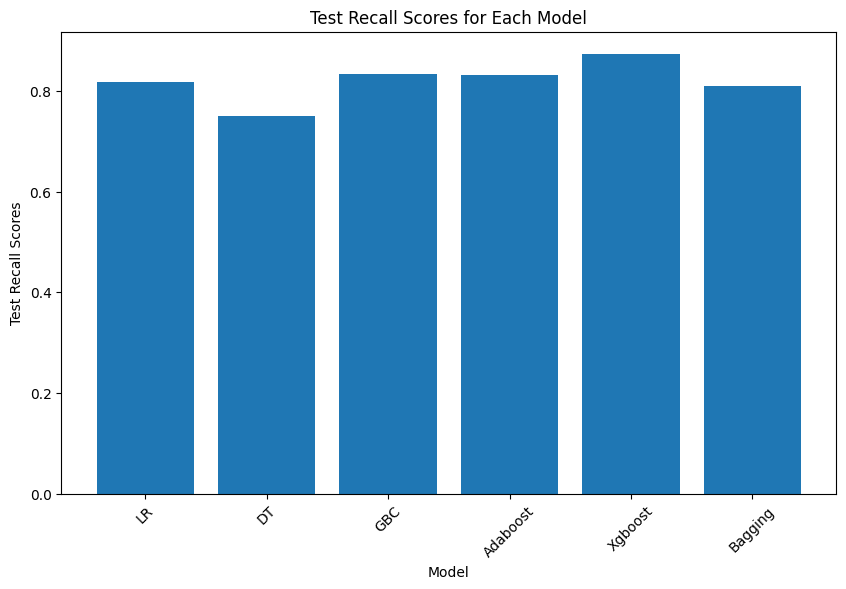

In [ ]:
# Plotting bar plot with Matplotlib
plt.figure(figsize=(10, 6))
plt.bar(evaluation_df['Model'], evaluation_df['Test_Recall'])
plt.title('Test Recall Scores for Each Model')
plt.xlabel('Model')
plt.ylabel('Test Recall Scores')
plt.xticks(rotation=45)
plt.show()


It is found that Xgboost performs well followed by the GBC and the Adaboost based on the recall score and cross validation .

# **SMOTE (Synthetic Minority Oversampling Technique) to fix the Imbalance dataset:**
Since out data set is imbalanced, we oversample the train data using SMOTE...



In [ ]:
# resample by adding samples to minority class using SMOTE
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks

# Suppress ConvergenceWarning
warnings.filterwarnings("ignore", category=FutureWarning)
# Reset warnings filter
warnings.filterwarnings("default", category=FutureWarning)

In [ ]:
from imblearn.over_sampling import SMOTE

# Print class distribution before oversampling
print("Before over Sampling, counts of label 'Yes': {}".format(sum(y_train.values.ravel() == 1)))
print("Before over Sampling, counts of label 'No': {} \n".format(sum(y_train.values.ravel() == 0)))

# SMOTE (Synthetic Minority Over Sampling Technique)
sm = SMOTE(sampling_strategy="minority", k_neighbors=10, random_state=1)
X_train_over, y_train_over = sm.fit_resample(X_train, y_train.values.ravel())

# Print class distribution after oversampling
print("After over sampling, counts of label 'Yes': {}".format(sum(y_train_over == 1)))
print("After over Sampling, counts of label 'No': {} \n".format(sum(y_train_over == 0)))

# Print shape of the oversampled dataset
print("After over Sampling, the shape of train_X: {}".format(X_train_over.shape))
print("After over Sampling, the shape of train_y: {} \n".format(y_train_over.shape))

Before over Sampling, counts of label 'Yes': 1302
Before over Sampling, counts of label 'No': 6799 

After over sampling, counts of label 'Yes': 6799
After over Sampling, counts of label 'No': 6799 

After over Sampling, the shape of train_X: (13598, 28)
After over Sampling, the shape of train_y: (13598,) 



# **Build Models with Oversampled Data From the SMOTE Technique:**

Again, all six algorithms are built and trained employing the over-sampled training data for training the models.

In [ ]:
# Define classifiers
algorithms = [
    ("LR_over", LogisticRegression(random_state=0, class_weight={0: 16, 1: 84}, solver= 'liblinear', max_iter=1000)),
    ("DT_over", DecisionTreeClassifier(random_state=0, class_weight={0: 16, 1: 84})),
    ("GBC_over", GradientBoostingClassifier(random_state=0)),
    ("Adaboost_over", AdaBoostClassifier(random_state=0)),
    ("Xgboost_over", XGBClassifier(random_state=0, eval_metric="logloss")),
    ("Bagging_over", BaggingClassifier(random_state=0))
]

# Initialize lists to store results
results = []
metrics = ['Accuracy', 'Recall', 'Precision', 'F1 Score']
evaluation_df = pd.DataFrame(columns=['Model', 'Cross_Val_Score_Train', 'Train_Accuracy', 'Test_Accuracy',
                                      'Train_Recall', 'Test_Recall', 'Train_Precision', 'Test_Precision',
                                      'Train_F1', 'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'])

# Loop through classifiers

for name, model in algorithms:
    # Cross-validation
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
    cv_result = cross_val_score(model, X_train_over, y_train_over, scoring='recall', cv=kfold)
    mean_recall = cv_result.mean()

    # Fit model
    model.fit(X_train_over, y_train_over)

    # Predict
    y_train_pred = model.predict(X_train_over)
    y_test_pred = model.predict(X_test)

    # Calculate evaluation metrics
    train_accuracy = accuracy_score(y_train_over, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    train_recall = recall_score(y_train_over, y_train_pred)
    test_recall = recall_score(y_test, y_test_pred)
    train_precision = precision_score(y_train_over, y_train_pred)
    test_precision = precision_score(y_test, y_test_pred)
    train_f1 = f1_score(y_train_over, y_train_pred)
    test_f1 = f1_score(y_test, y_test_pred)
    train_roc_auc = roc_auc_score(y_train_over, y_train_pred)
    test_roc_auc = roc_auc_score(y_test, y_test_pred)

    # Store results
    results.append((name, mean_recall, train_accuracy, test_accuracy, train_recall, test_recall, train_precision,
                    test_precision, train_f1, test_f1, train_roc_auc, test_roc_auc))

# Create DataFrame from results
evaluation_df_over = pd.DataFrame(results, columns=['Model', 'Cross_Val_Score_Train', 'Train_Accuracy', 'Test_Accuracy',
                                               'Train_Recall', 'Test_Recall', 'Train_Precision', 'Test_Precision',
                                               'Train_F1', 'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'])

evaluation_df_over_sorted = evaluation_df_over.sort_values(by=['Test_Recall','Cross_Val_Score_Train'], ascending=False)

# Highlighting maximum value in green and minimum value in red
def highlight_max_min(s):
    is_max = s == s.max()
    is_min = s == s.min()
    styles = np.where(is_max, 'background-color: green', np.where(is_min, 'background-color: red', ''))
    return styles



# Apply conditional formatting without considering the index
evaluation_df_style_over = evaluation_df_over_sorted.style.apply(highlight_max_min, subset=['Cross_Val_Score_Train', 'Train_Accuracy',
                                                                          'Test_Accuracy', 'Train_Recall', 'Test_Recall',
                                                                          'Train_Precision', 'Test_Precision', 'Train_F1',
                                                                          'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'], axis=None)

# Display styled DataFrame
evaluation_df_style_over

,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
3,Adaboost_over,0.964553,0.958965,0.947680,0.962347,0.910769,0.955880,0.793566,0.959103,0.848138,0.958965,0.932751
2,GBC_over,0.973819,0.976982,0.958539,0.979997,0.898462,0.974123,0.851312,0.977051,0.874251,0.976982,0.934240
4,Xgboost_over,0.985880,1.000000,0.969398,1.000000,0.883077,1.000000,0.922830,1.000000,0.902516,1.000000,0.934484
0,LR_over,0.973232,0.860494,0.792201,0.974114,0.883077,0.793744,0.428358,0.874728,0.576884,0.860494,0.828958
5,Bagging_over,0.962788,0.998014,0.948667,0.997353,0.843077,0.998675,0.837920,0.998013,0.840491,0.998014,0.905959
1,DT_over,0.948373,1.000000,0.916091,1.000000,0.744615,1.000000,0.735562,1.000000,0.740061,1.000000,0.846735


# **Comparing the original model with the oversampled model:**

In [ ]:
# Concatenate the styled representations
df_compare = pd.concat([evaluation_df_style_over.data, evaluation_df_style.data], axis=0)

# Set a custom index
df_compare.index = ['Evaluation_df_Over'] * len(evaluation_df_style_over.data) + ['Evaluation_df'] * len(evaluation_df_style.data)

# Reset the index to make it unique
df_compare_reset_index = df_compare.reset_index(drop=True)

# Sort the DataFrame by index
df_compare_sorted = df_compare_reset_index.sort_index()

# Sort the DataFrame by 'Cross_Val_Score_Train' and 'Test_Recall'
df_compare_sorted = df_compare_sorted.sort_values(by=['Test_Recall','Cross_Val_Score_Train'], ascending=False)

# Apply conditional formatting
styled_df_compare = df_compare_sorted.style.apply(highlight_max_min, subset=['Cross_Val_Score_Train', 'Train_Accuracy',
                                                                              'Test_Accuracy', 'Train_Recall', 'Test_Recall',
                                                                              'Train_Precision', 'Test_Precision', 'Train_F1',
                                                                              'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'], axis=None)
# Display the sorted DataFrame
styled_df_compare

,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
0,Adaboost_over,0.964553,0.958965,0.947680,0.962347,0.910769,0.955880,0.793566,0.959103,0.848138,0.958965,0.932751
1,GBC_over,0.973819,0.976982,0.958539,0.979997,0.898462,0.974123,0.851312,0.977051,0.874251,0.976982,0.934240
2,Xgboost_over,0.985880,1.000000,0.969398,1.000000,0.883077,1.000000,0.922830,1.000000,0.902516,1.000000,0.934484
3,LR_over,0.973232,0.860494,0.792201,0.974114,0.883077,0.793744,0.428358,0.874728,0.576884,0.860494,0.828958
6,Xgboost,0.884775,1.000000,0.969398,1.000000,0.873846,1.000000,0.931148,1.000000,0.901587,1.000000,0.930750
4,Bagging_over,0.962788,0.998014,0.948667,0.997353,0.843077,0.998675,0.837920,0.998013,0.840491,0.998014,0.905959
7,GBC,0.844816,0.976176,0.964956,0.890937,0.833846,0.957886,0.940972,0.923199,0.884176,0.941718,0.911926
8,Adaboost,0.822573,0.962474,0.959526,0.864055,0.830769,0.898562,0.909091,0.880971,0.868167,0.922688,0.907448
9,LR,0.853266,0.850142,0.849951,0.860215,0.818462,0.520446,0.520548,0.648523,0.636364,0.854214,0.837214
10,Bagging,0.816434,0.996544,0.955577,0.983871,0.809231,0.994565,0.903780,0.989189,0.853896,0.991421,0.896385


It is found that Adaboost_over performs well again followed by the GBC_over and  Xgboost_over based on the test recall score and cross validation. Now we check the performance of each model with undersampled dataset




# **Undersampling the train data employing the Random Under Sampler Technique**

Undersampling serves as an alternative approach to addressing dataset imbalance.

In random undersampling, instances from the majority class are randomly chosen and removed from the training dataset until achieving balance.

In [ ]:
from imblearn.under_sampling import RandomUnderSampler

In [ ]:
rus = RandomUnderSampler(random_state=2)
X_train_under, y_train_under = rus.fit_resample(X_train, y_train.values.ravel())

In [ ]:
print("Before Under Sampling, counts of label 'Yes': {}".format(sum(y_train.values.ravel() == 1)))
print("Before Under Sampling, counts of label 'No': {} \n".format(sum(y_train.values.ravel() == 0)))

print("After Under Sampling, counts of label 'Yes': {}".format(sum(y_train_under == 1)))
print("After Under Sampling, counts of label 'No': {} \n".format(sum(y_train_under == 0)))

print("After Under Sampling, the shape of train_X: {}".format(X_train_under.shape))
print("After Under Sampling, the shape of train_y: {} \n".format(y_train_under.shape))

Before Under Sampling, counts of label 'Yes': 1302
Before Under Sampling, counts of label 'No': 6799 

After Under Sampling, counts of label 'Yes': 1302
After Under Sampling, counts of label 'No': 1302 

After Under Sampling, the shape of train_X: (2604, 28)
After Under Sampling, the shape of train_y: (2604,) 



# **Building and training the model with undersampled data:**

In [ ]:
# Define classifiers
algorithms = [
    ("LR_under", LogisticRegression(random_state=0, class_weight={0: 16, 1: 84}, solver= 'liblinear', max_iter=1000)),
    ("DT_under", DecisionTreeClassifier(random_state=0, class_weight={0: 16, 1: 84})),
    ("GBC_under", GradientBoostingClassifier(random_state=0)),
    ("Adaboost_under", AdaBoostClassifier(random_state=0)),
    ("Xgboost_under", XGBClassifier(random_state=0, eval_metric="logloss")),
    ("Bagging_under", BaggingClassifier(random_state=0))
]

# Initialize lists to store results
results = []
metrics = ['Accuracy', 'Recall', 'Precision', 'F1 Score']
evaluation_df = pd.DataFrame(columns=['Model', 'Cross_Val_Score_Train', 'Train_Accuracy', 'Test_Accuracy',
                                      'Train_Recall', 'Test_Recall', 'Train_Precision', 'Test_Precision',
                                      'Train_F1', 'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'])

# Loop through classifiers

for name, model in algorithms:
    # Cross-validation
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)#gives model's performance across different folds of the training data
    cv_result = cross_val_score(model, X_train_under, y_train_under, scoring='recall', cv=kfold)
    mean_recall = cv_result.mean()

    # Fit model
    model.fit(X_train_under, y_train_under)

    # Predict
    y_train_pred = model.predict(X_train_under)
    y_test_pred = model.predict(X_test)

    # Calculate evaluation metrics
    train_accuracy = accuracy_score(y_train_under, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    train_recall = recall_score(y_train_under, y_train_pred)
    test_recall = recall_score(y_test, y_test_pred)
    train_precision = precision_score(y_train_under, y_train_pred)
    test_precision = precision_score(y_test, y_test_pred)
    train_f1 = f1_score(y_train_under, y_train_pred)
    test_f1 = f1_score(y_test, y_test_pred)
    train_roc_auc = roc_auc_score(y_train_under, y_train_pred)
    test_roc_auc = roc_auc_score(y_test, y_test_pred)

    # Store results
    results.append((name, mean_recall, train_accuracy, test_accuracy, train_recall, test_recall, train_precision,
                    test_precision, train_f1, test_f1, train_roc_auc, test_roc_auc))

# Create DataFrame from results
evaluation_df_under = pd.DataFrame(results, columns=['Model', 'Cross_Val_Score_Train', 'Train_Accuracy', 'Test_Accuracy',
                                               'Train_Recall', 'Test_Recall', 'Train_Precision', 'Test_Precision',
                                               'Train_F1', 'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'])

evaluation_df_under_sorted = evaluation_df_under.sort_values(by=['Test_Recall','Cross_Val_Score_Train'], ascending=False)

# Highlighting maximum value in green and minimum value in red
def highlight_max_min(s):
    is_max = s == s.max()
    is_min = s == s.min()
    styles = np.where(is_max, 'background-color: green', np.where(is_min, 'background-color: red', ''))
    return styles

# Apply conditional formatting without considering the index
evaluation_df_style_under = evaluation_df_under_sorted.style.apply(highlight_max_min, subset=['Cross_Val_Score_Train', 'Train_Accuracy',
                                                                          'Test_Accuracy', 'Train_Recall', 'Test_Recall',
                                                                          'Train_Precision', 'Test_Precision', 'Train_F1',
                                                                          'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'], axis=None)

# Display styled DataFrame
evaluation_df_style_under

,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
3,Adaboost_under,0.942390,0.951613,0.933366,0.957757,0.960000,0.946131,0.718894,0.951908,0.822134,0.951613,0.944139
0,LR_under,0.963905,0.789939,0.688549,0.972350,0.953846,0.712437,0.334773,0.822345,0.495604,0.789939,0.795853
2,GBC_under,0.952387,0.979263,0.949161,0.985407,0.950769,0.973445,0.780303,0.979389,0.857143,0.979263,0.949811
4,Xgboost_under,0.956985,1.000000,0.956071,1.000000,0.947692,1.000000,0.810526,1.000000,0.873759,1.000000,0.952682
1,DT_under,0.887860,1.000000,0.903751,1.000000,0.910769,1.000000,0.640693,1.000000,0.752224,1.000000,0.906590
5,Bagging_under,0.913973,0.996160,0.936328,0.993088,0.904615,0.999227,0.750000,0.996148,0.820084,0.996160,0.923501


based on rus, Adaboost_under performs well followed by the LR_under and GBC_under based on the undersampling dataset.

# **Comparing the Performance of the original model with the oversampled and undersampled model:**

In [ ]:
# Concatenate the styled representations
df_compare = pd.concat([evaluation_df_style_over.data, evaluation_df_style_under.data, evaluation_df_style.data], axis=0)

# Set a custom index
df_compare.index = ['Evaluation_df_Over'] * len(evaluation_df_style_over.data)+['Evaluation_df_Under'] * len(evaluation_df_style_under.data)  + ['Evaluation_df'] * len(evaluation_df_style.data)

# Reset the index to make it unique
df_compare_reset_index = df_compare.reset_index(drop=True)

# Sort the DataFrame by index
df_compare_sorted = df_compare_reset_index.sort_index()

# Sort the DataFrame by 'Cross_Val_Score_Train' and 'Test_Recall'
df_compare_sorted = df_compare_sorted.sort_values(by=['Test_Recall', 'Cross_Val_Score_Train',], ascending=False)

# Apply conditional formatting
styled_df_compare = df_compare_sorted.style.apply(highlight_max_min, subset=['Cross_Val_Score_Train', 'Train_Accuracy',
                                                                              'Test_Accuracy', 'Train_Recall', 'Test_Recall',
                                                                              'Train_Precision', 'Test_Precision', 'Train_F1',
                                                                              'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'], axis=None)
# Display the sorted DataFrame
styled_df_compare

,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
6,Adaboost_under,0.942390,0.951613,0.933366,0.957757,0.960000,0.946131,0.718894,0.951908,0.822134,0.951613,0.944139
7,LR_under,0.963905,0.789939,0.688549,0.972350,0.953846,0.712437,0.334773,0.822345,0.495604,0.789939,0.795853
8,GBC_under,0.952387,0.979263,0.949161,0.985407,0.950769,0.973445,0.780303,0.979389,0.857143,0.979263,0.949811
9,Xgboost_under,0.956985,1.000000,0.956071,1.000000,0.947692,1.000000,0.810526,1.000000,0.873759,1.000000,0.952682
0,Adaboost_over,0.964553,0.958965,0.947680,0.962347,0.910769,0.955880,0.793566,0.959103,0.848138,0.958965,0.932751
10,DT_under,0.887860,1.000000,0.903751,1.000000,0.910769,1.000000,0.640693,1.000000,0.752224,1.000000,0.906590
11,Bagging_under,0.913973,0.996160,0.936328,0.993088,0.904615,0.999227,0.750000,0.996148,0.820084,0.996160,0.923501
1,GBC_over,0.973819,0.976982,0.958539,0.979997,0.898462,0.974123,0.851312,0.977051,0.874251,0.976982,0.934240
2,Xgboost_over,0.985880,1.000000,0.969398,1.000000,0.883077,1.000000,0.922830,1.000000,0.902516,1.000000,0.934484
3,LR_over,0.973232,0.860494,0.792201,0.974114,0.883077,0.793744,0.428358,0.874728,0.576884,0.860494,0.828958


Based on the above results, following are the four best models:

 a) Adaboost_under with the under sampling dataset,

 b) LR_under Classifier with under sampling dataset,

 c) GBC_under Classifier with under sampling dataset,

 d) Xgboost_under with the oversampled dataset.

 Now, above-mentioned 4 models will be tuned employing the Random Search CV.


# How to choose the model for hyperparameter tuning?

Comparing the "Cross_Val_Score_Train" and the "Test_Recall",

a) Cross_Val_Score_Train of Adaboost_under  < Test_Recall of  Adaboost_under , there is a bit sign of overfitting. Hence, the Adaboost_under  model is chosen for the hyperparameter tuning.

b) Cross_Val_Score_Train of LR_under > Test_Recall of LR_under Classifier, there is a bit sign of underfitting. Hence, the LR_under Classifier model is chosen for the hyperparameter tuning.

c) Cross_Val_Score_Train of GBC_under < Test_Recall of  GBC_underClassifier, there is a bit sign of underfitting. Hence, the GBC_under Classifier model is chosen for the hyperparameter tuning.

d) Cross_Val_Score_Train of Xgboost_under with the undersampled data model < Test_Recall of  Xgboost_under with the oversampled data model, there is a bit sign of underfitting. Hence, the Xgboost_under Classifier model is chosen for the hyperparameter tuning.

# **Hyperparameter Tuning:**

The process of searching the optimal values of hyperparameters for any machine learning algorithm is called hyperparameter tuning/optimization.

The goal of Hyperparameter Tuning is to achieve a minimum error from the outcome of any ML models.

The Hyperparameter Tuning influences the convergence of any ML Algorithm to a large extent.

There are different types of Hyperparameter Tuning Methods:

1. GridSearch--slow method

2. RandomSearch--faster method

3. Successive Halving

4. Bayesian Optimizers

5. Manual Search

Here, I will conduct the RandomSearch cross-validation techique to tune the parameters of the ML models.



# **Model Tuning using RandomizedSearchCV**

**Tuning Logistic regression with the original dataset:**

Here, I will find the best parameter for high recall using Random Search with cross validation.

# **Getting the best parameters for tuning the model:**

In [ ]:
%%time

import warnings
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import AdaBoostClassifier
from sklearn import metrics

# Defining the AdaBoostClassifier model
model = AdaBoostClassifier(random_state=0)

# Parameter grid to pass in RandomizedSearchCV
param_grid = {
    'n_estimators': np.arange(50, 1000, 50),
    'learning_rate': [0.01, 0.1, 0.2, 0.05]
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling RandomizedSearchCV with reduced number of iterations
Adaboost_under_tuned = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_grid,
    n_iter=10,  # Reduced number of iterations
    scoring=scorer,
    cv=5,  # Reduced number of cross-validation folds
    random_state=42,
    n_jobs=-1
)

# Fitting parameters in RandomizedSearchCV
Adaboost_under_tuned.fit(X_train_under, y_train_under)

print("Best parameters are {} with CV score={}".format(Adaboost_under_tuned.best_params_, Adaboost_under_tuned.best_score_))

Best parameters are {'n_estimators': 400, 'learning_rate': 0.2} with CV score=0.943150604185087
CPU times: user 3.2 s, sys: 199 ms, total: 3.4 s
Wall time: 1min 43s


# Tuning the first best model (Adaboost_under  with undersampled dataset):
**Building the Adaboost_under  model with the  tuned/best parameters from the RandomizedSearchCV Techniques:**

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

# Defining the best parameters obtained from hyperparameter tuning
best_params = {
    'n_estimators': 400,
    'learning_rate': 0.2
}

# Building AdaBoostClassifier model with best parameters
ada_tuned_model = AdaBoostClassifier(**best_params, random_state=0)

# Fitting the model on training data
ada_tuned_model.fit(X_train_under, y_train_under)


AdaBoostClassifier(learning_rate=0.2, n_estimators=400, random_state=0)

# **Getting Confusion matrix on test dataset:**

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn import metrics

def make_confusion_matrix(model, test_X, y_actual, labels=[1, 0]):
    """
    model : classifier to predict values of X
    test_X: test set
    y_actual : ground truth
    """
    # Predict labels using the model
    y_predict = model.predict(test_X)

    # Compute confusion matrix
    cm = metrics.confusion_matrix(y_actual, y_predict, labels=labels)

    # Compute TP, TN, FP, FN
    TP = cm[0, 0]
    FN = cm[0, 1]
    FP = cm[1, 0]
    TN = cm[1, 1]

    # Format labels for heatmap annotations
    group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cm.flatten() / np.sum(cm)]
    labels = [f"TP: {TP}\n{group_percentages[0]}", f"FN: {FN}\n{group_percentages[1]}", f"FP: {FP}\n{group_percentages[2]}", f"TN: {TN}\n{group_percentages[3]}"]
    labels = np.asarray(labels).reshape(2, 2)

    # Create heatmap
    plt.figure(figsize=(5, 3))
    sns.heatmap(cm, annot=labels, fmt="", cmap="Blues", xticklabels=["Predicted - Attrited", "Predicted - Existing"], yticklabels=["Actual - Attrited", "Actual - Existing"]).set(title="Confusion Matrix")
    plt.xlabel("Predicted labels")
    plt.ylabel("True labels")
    plt.show()

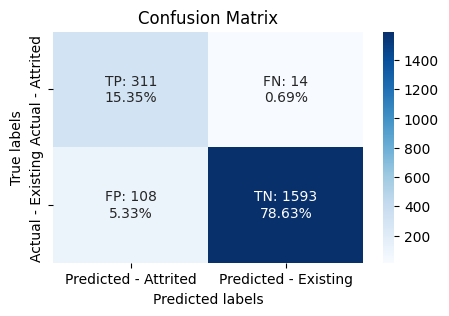

In [ ]:
make_confusion_matrix(ada_tuned_model, X_test, y_test)

# **Tuning the second best model (LR_under Classifier with undersampled dataset):**


# **Getting the best parameter for tuning the model:**

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

# Define the Logistic Regression model
lr_model = LogisticRegression(random_state=1)

# Define the parameter grid
param_grid_lr = {
    'solver': ['liblinear'],  # Only 'liblinear' solver supports L1 penalty
    'penalty': ['l1', 'l2'],  # Regularization penalties
    'C': [0.001, 0.01, 0.1, 1, 10]  # Regularization parameter
}

# Define the scoring metric
scorer = metrics.make_scorer(metrics.recall_score)

# Define RandomizedSearchCV with reduced iterations and CV folds
lr_under= RandomizedSearchCV(
    estimator=lr_model,
    param_distributions=param_grid_lr,
    n_iter=10,
    scoring=scorer,
    cv=5,
    random_state=42,
    n_jobs=-1
)

# Fit the RandomizedSearchCV
lr_under.fit(X_train_under, y_train_under)

# Print the best parameters and CV score
print("Best parameters are {} with CV score={}".format(lr_under.best_params_, lr_under.best_score_))




Best parameters are {'solver': 'liblinear', 'penalty': 'l1', 'C': 0.01} with CV score=0.8709519599174772


# Tuning the Second best model (LR_under with undersampled dataset):
**Building the LR_under model with the  tuned/best parameters from the RandomizedSearchCV Techniques:**

In [ ]:
from sklearn.linear_model import LogisticRegression

# Define the best parameters obtained from hyperparameter tuning
best_params_lr = {
    'solver': 'liblinear',
    'penalty': 'l1',
    'C': 0.01
}

# Build Logistic Regression model with best parameters
lr_under_model = LogisticRegression(**best_params_lr, max_iter=1000, random_state=1)

# Fit the model on the entire training data
lr_under_model.fit(X_train_under, y_train_under)


LogisticRegression(C=0.01, max_iter=1000, penalty='l1', random_state=1,
                   solver='liblinear')

# **Getting Confusion matrix on test dataset:**

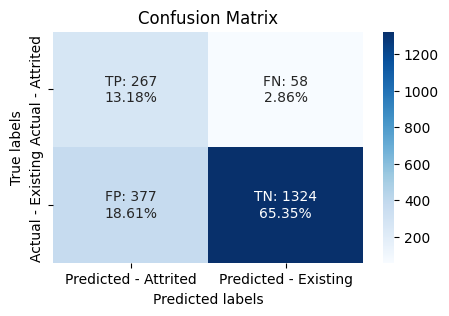

In [ ]:
make_confusion_matrix(lr_under_model, X_test, y_test)

# **Tuning the third best model (GBC_under Classifier with the undersampled dataset**)


**Getting the best parameter for tuning the GBC_under Classifier model:**

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn import metrics

# Define the model
gbc_model = GradientBoostingClassifier(random_state=1)

# Define the parameter grid with reduced search space
param_grid_gbc = {
    'n_estimators': [50, 100],
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 4],
}

# Define the scoring metric
scorer = metrics.make_scorer(metrics.recall_score)

# Define RandomizedSearchCV with reduced iterations and CV folds
gbc_tuned = RandomizedSearchCV(
    estimator=gbc_model,
    param_distributions=param_grid_gbc,
    n_iter=5,  # Reduced number of iterations
    scoring=scorer,
    cv=3,  # Reduced number of CV folds
    random_state=42,
    n_jobs=-1
)

# Fit the RandomizedSearchCV
gbc_tuned.fit(X_train, y_train)

print("Best parameters are {} with CV score={}".format(gbc_tuned.best_params_, gbc_tuned.best_score_))


Best parameters are {'n_estimators': 100, 'max_depth': 4, 'learning_rate': 0.1} with CV score=0.8640552995391705


# Tuning the third best model (gbc_under classifier with undersampled dataset):
**Building the Xggbc_under classifier boost model with the  tuned/best parameters from the RandomizedSearchCV Techniques:**

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

# Define the best parameters obtained from hyperparameter tuning
best_params_gbc_under = {
    'n_estimators': 100,
    'max_depth': 4,
    'learning_rate': 0.1
}

# Build Gradient Boosting Classifier model with best parameters
gbc_under_model = GradientBoostingClassifier(**best_params_gbc_under, random_state=1)

# Fit the model on the entire training data
gbc_under_model.fit(X_train_under, y_train_under)


GradientBoostingClassifier(max_depth=4, random_state=1)

# **Getting Confusion matrix on validation dataset:**

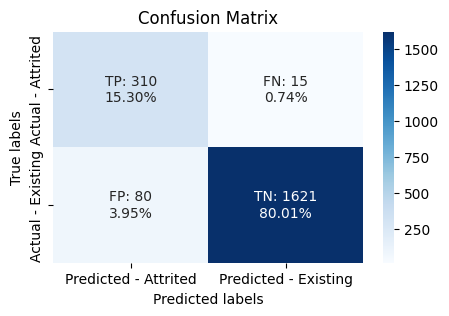

In [ ]:
make_confusion_matrix(gbc_under_model, X_test, y_test)

# **Tuning the fourth best model (Xgboost_under  with the undersampled dataset)**


**Getting the best parameter for tuning the Xgboost_under model with the undersampled dataset :**

In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn import metrics
import numpy as np

# Define the XGBoost model
xgb_model_under = XGBClassifier(random_state=1)

# Define the parameter grid with reduced search space
param_grid_xgb_under = {
    'n_estimators': np.arange(50, 151, 50),
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 4],
}

# Define the scoring metric
scorer = metrics.make_scorer(metrics.recall_score)

# Define RandomizedSearchCV with reduced iterations and CV folds
xgb_tuned_under = RandomizedSearchCV(
    estimator=xgb_model_under,
    param_distributions=param_grid_xgb_under,
    n_iter=5,  # Reduced number of iterations
    scoring=scorer,
    cv=3,  # Reduced number of CV folds
    random_state=42,
    n_jobs=-1
)

# Fit the RandomizedSearchCV
xgb_tuned_under.fit(X_train_under, y_train_under)

# Print the best parameters and CV score
print("Best parameters are {} with CV score={}".format(xgb_tuned_under.best_params_, xgb_tuned_under.best_score_))



Best parameters are {'n_estimators': 150, 'max_depth': 3, 'learning_rate': 0.1} with CV score=0.9531490015360983


# Tuning the fourth best model (Logistic regression with the oversampled dataset):
**Building the Logistic regression with the oversampled dataset with the  tuned/best parameters from the RandomizedSearchCV Techniques:**

In [ ]:
from xgboost import XGBClassifier

# Define the XGBoost model with the best parameters
xgb_model_under = XGBClassifier(n_estimators=150, max_depth=3, learning_rate=0.1, random_state=1)

# Train the model on the entire training data
xgb_model_under.fit(X_train_under, y_train_under)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=150, n_jobs=None,
              num_parallel_tree=None, random_state=1, ...)

# **Getting Confusion matrix on validation dataset:**

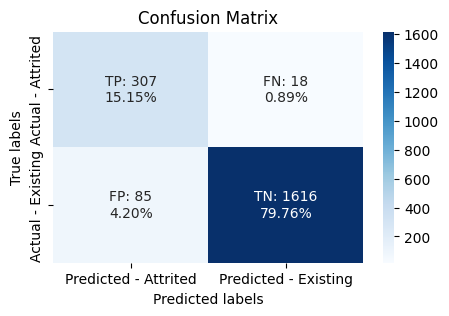

In [ ]:
make_confusion_matrix(xgb_model_under, X_test, y_test)

# **Comparing the best Models after hypertuned parameter:**

In [ ]:
best_df1=evaluation_df_under.iloc[[3, 0,2, 4]] # derived from the original LR model

best_df1.sort_values(by=['Test_Recall','Cross_Val_Score_Train'],ascending=False)
best_df1.reset_index(drop=True, inplace=True)
styled_df_compare = best_df1.style.apply(highlight_max_min, subset=['Cross_Val_Score_Train', 'Train_Accuracy',
                                                                              'Test_Accuracy', 'Train_Recall', 'Test_Recall',
                                                                              'Train_Precision', 'Test_Precision', 'Train_F1',
                                                                              'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'], axis=None)
# Display the sorted DataFrame
styled_df_compare

,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
0,Adaboost_under,0.942390,0.951613,0.933366,0.957757,0.960000,0.946131,0.718894,0.951908,0.822134,0.951613,0.944139
1,LR_under,0.963905,0.789939,0.688549,0.972350,0.953846,0.712437,0.334773,0.822345,0.495604,0.789939,0.795853
2,GBC_under,0.952387,0.979263,0.949161,0.985407,0.950769,0.973445,0.780303,0.979389,0.857143,0.979263,0.949811
3,Xgboost_under,0.956985,1.000000,0.956071,1.000000,0.947692,1.000000,0.810526,1.000000,0.873759,1.000000,0.952682


# **Choosing the best Final Model Selection:**

Based on the specific requirements of my problem (e.g., emphasis on avoiding false negatives, minimizing false positives, overall model performance), I choose the Adaboost_under Classifier as the best model.


# **Checking the Test Data on Adaboost_under Classifier with under dataset**

Since feature importance analysis is typically performed after training a machine learning model to understand which features or variables have the most significant impact on the model's predictions, I am going to implement the feature importance identifying the most relevant features for prediction and removing less important features to reduce overfitting, and improve generalization performance of the best selected model.

# **Visualizing the Feature Importance for the best model**
There are several methods to determine feature importance in machine learning models. Each method has its strengths and weaknesses, and the choice of method depends on factors such as the type of model, the interpretability of results, and the nature of the dataset.

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
# Building AdaBoostClassifier model with best parameters
ada_tuned_model = AdaBoostClassifier(n_estimators=400, learning_rate=0.2, random_state=0)

# Fitting the model on training data
ada_tuned_model.fit(X_train_under, y_train_under)

AdaBoostClassifier(learning_rate=0.2, n_estimators=400, random_state=0)

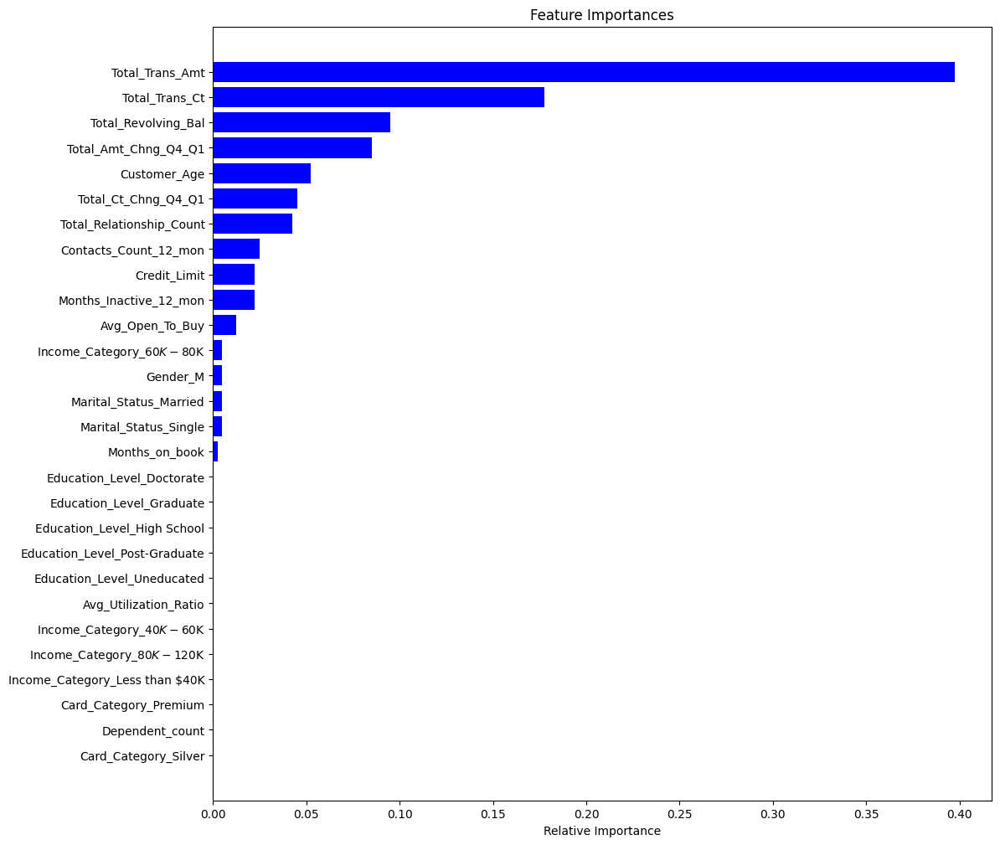

In [ ]:
import matplotlib.pyplot as plt

# Get feature importances from the trained AdaBoost model
importances = ada_tuned_model.feature_importances_

# Get feature names (assuming X_train_under.columns contains feature names)
feature_names = X_train_under.columns

# Sort indices based on importances
indices = importances.argsort()

# Create a horizontal bar plot to visualize feature importances
plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="blue", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()



In [ ]:
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score

# Make predictions on the test data
y_pred = ada_tuned_model.predict(X_test)

# Calculate evaluation metrics
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)

# Print evaluation metrics
print("Evaluation Metrics for AdaBoost Model:")
print(f"Accuracy: {accuracy:.6f}")
print(f"Recall: {recall:.6f}")
print(f"Precision: {precision:.6f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC AUC Score: {roc_auc:.6f}")



Evaluation Metrics for AdaBoost Model:
Accuracy: 0.939783
Recall: 0.956923
Precision: 0.742243
F1 Score: 0.8360
ROC AUC Score: 0.946716


## **Confusion Matrix of the best model:Xgboost**

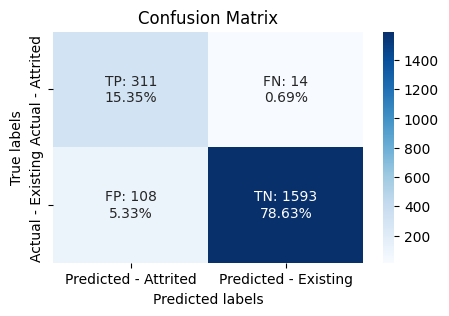

In [ ]:
make_confusion_matrix(ada_tuned_model, X_test, y_test)

**Cumulative Lift/Gain Chart:**

A Cumulative Lift or Gain Chart is a graphical representation that compares the performance of a predictive model with a random selection. It is commonly used in marketing and sales to evaluate the effectiveness of predictive models, such as those used in customer churn prediction or lead scoring.Cumulative lift/gain chart is important to understand how a model would perform in production system with unseen data

In [ ]:
!pip install scikit-plot

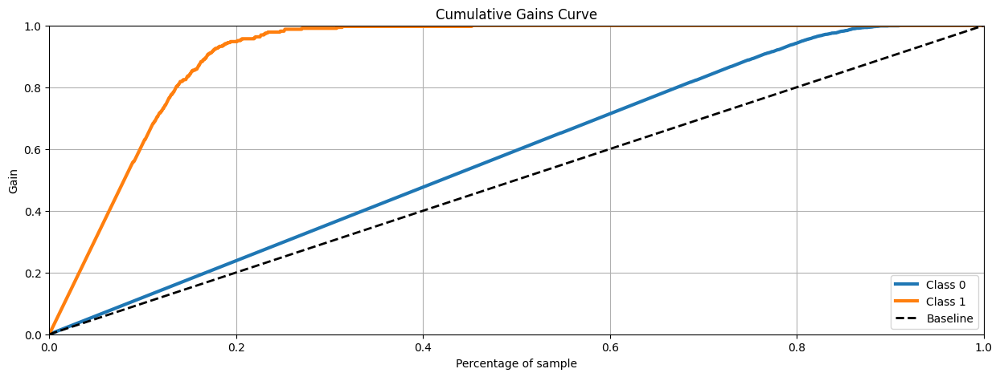

In [ ]:
import scikitplot as skplt

# Predict probabilities for test data
y_pred_prob = ada_tuned_model.predict_proba(X_test)

# Plot cumulative gains chart
skplt.metrics.plot_cumulative_gain(y_test, y_pred_prob, figsize=(15, 5))
plt.show()



The above chart depicts that if we sort the customers in the descending order of the probability of attrition (class 1), and target the top ~30% of the population, we are most likely to find 100% of the people who would actually attrite

## **ROC-AUC Curve:**
ROC AUC characteristic is important to understand how good the model is.
ROC AUC (Receiver Operating Characteristic Area Under the Curve) is a metric used to evaluate the performance of a binary classification model. It quantifies the ability of the model to distinguish between the positive and negative classes across different threshold values.
If the model is really good in identifying the classes, the Area Under Curve is really high, close to 1.
If the model can not distinguish the classes well, the Area Under Curve is really low, close to 0.5.

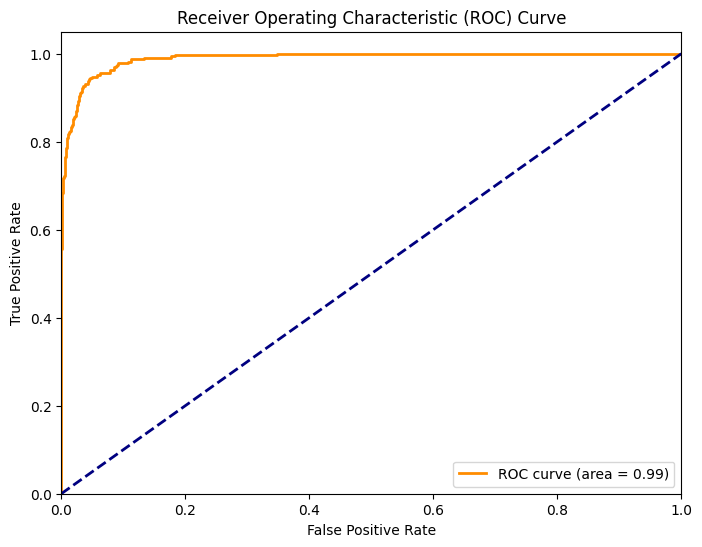

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Get predicted probabilities for the positive class
y_pred_prob = ada_tuned_model.predict_proba(X_test)[:, 1]

# Compute ROC curve and ROC area
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()





An AUC (Area Under the ROC Curve) value of 0.99 indicates that the model has very high predictive performance.

# **Productionizing the model:**
Now that we've settled on our final model, we'll create an ML pipeline using Sklearn.pipeline to automate various stages of model development. This pipeline will handle data preprocessing, model training, evaluation, and prediction in a systematic manner. By encapsulating these tasks into a single pipeline, we can ensure consistency, streamline the process, and facilitate easier model iteration and deployment. This approach enhances efficiency and enables seamless transition from raw data to actionable insights for real-world applications.

## **Data processing Steps:**
Cols to drop:
since Credit_lim and avg_open_to_buy are highly correlated, we drop Credit_lim. Also, "customer_age" and  "months_on_book" are highly correlated but feature importance socre of "months_on_book" is very low, so we drop "months_on_book" column.

Similarly, wr are dropping 'Education_Level',Avg_Utilization_Ratio', 'Card_Category' and 'Dependent_count' because of no significant effect on final reasult based on feature importance graph.

# **Build the pipeline**

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, RobustScaler
from sklearn.ensemble import AdaBoostClassifier
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import train_test_split
import pandas as pd

# Load the dataset
df = pd.read_csv("/content/BankChurners.csv")  # Replace "your_dataset.csv" with the path to your dataset

# Handle missing values in 'Customer_Age'
df['Customer_Age'].fillna(df['Customer_Age'].median(), inplace=True)

# Define feature processing functions
def preprocess(df):
    df['Income_Category'].replace('Unknown', 'abc', inplace=True)
    df['Income_Category'].replace('abc', df['Income_Category'].mode()[0], inplace=True)
    return df

# Apply preprocessing
df = preprocess(df)

# Define features and target
X = df.drop(columns=["Attrition_Flag"])
y = df["Attrition_Flag"].map({"Attrited Customer": 1, "Existing Customer": 0})

# Dropping insignificant columns
columns_to_drop = [
    "CLIENTNUM",
    "Credit_Limit",
    "Dependent_count",
    "Months_on_book",
    "Avg_Open_To_Buy",
    "Education_Level",
    "Avg_Utilization_Ratio",
    "Card_Category"
]

# For masking a particular value in a feature
column_to_mask_value = "Income_Category"
value_to_mask = "abc"
masked_value = "Unknown"

# Define preprocessing steps for the pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('drop_columns', 'drop', columns_to_drop),  # Drop the specified columns
        ('categorical', OneHotEncoder(handle_unknown='ignore'), ['Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']),
        ('numerical', RobustScaler(), ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'])
    ],
    remainder='passthrough'
)

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Perform random undersampling
rus = RandomUnderSampler(random_state=42)
X_train_under, y_train_under = rus.fit_resample(X_train, y_train)

# Define the best parameters obtained from hyperparameter tuning
best_params = {
    'n_estimators': 400,
    'learning_rate': 0.2
}

# Building AdaBoostClassifier model with best parameters
ada_tuned_model = AdaBoostClassifier(**best_params, random_state=0)

# Create the pipeline
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('model', ada_tuned_model)
])

# Fit the pipeline with undersampled data
pipeline.fit(X_train_under, y_train_under)

# Transform the test data using the pipeline's preprocessor
X_test_transformed = pipeline.named_steps['preprocessor'].transform(X_test)


# **Calculating the acuracy and recall of pipeline:**

In [ ]:
from sklearn.metrics import accuracy_score, recall_score

# Predict probabilities and round to get binary predictions
pred_train_p = pipeline.predict_proba(X_train_under)[:, 1] > 0.5
pred_test_p = pipeline.predict_proba(X_test)[:, 1] > 0.5

pred_train_p = pred_train_p.astype(int)
pred_test_p = pred_test_p.astype(int)

# Calculate accuracy
train_acc_p = accuracy_score(pred_train_p, y_train_under)
test_acc_p = accuracy_score(pred_test_p, y_test)

# Calculate recall
train_recall_p = recall_score(y_train_under, pred_train_p)
test_recall_p = recall_score(y_test, pred_test_p)

print(f"Train Accuracy: {train_acc_p}")
print(f"Test Accuracy: {test_acc_p}")
print(f"Train Recall: {train_recall_p}")
print(f"Test Recall: {test_recall_p}")

Train Accuracy: 0.9546850998463902
Test Accuracy: 0.941263573543929
Train Recall: 0.9639016897081413
Test Recall: 0.9261538461538461


In [ ]:
# import matplotlib.pyplot as plt

# # Get feature importances from the trained AdaBoost model
# importances = pipeline.named_steps['model'].feature_importances_

# # Get feature names after preprocessing
# preprocessed_features_cat = pipeline.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(input_features=['Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category'])
# original_features_filtered = X.columns.drop(['Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category'])
# feature_names = list(original_features_filtered) + list(preprocessed_features_cat)

# # Sort indices based on importances
# indices = importances.argsort()

# # Create a horizontal bar plot to visualize feature importances
# plt.figure(figsize=(12, 12))
# plt.title("Feature Importances")
# plt.barh(range(len(indices)), importances[indices], color="blue", align="center")
# plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
# plt.xlabel("Relative Importance")
# plt.show()



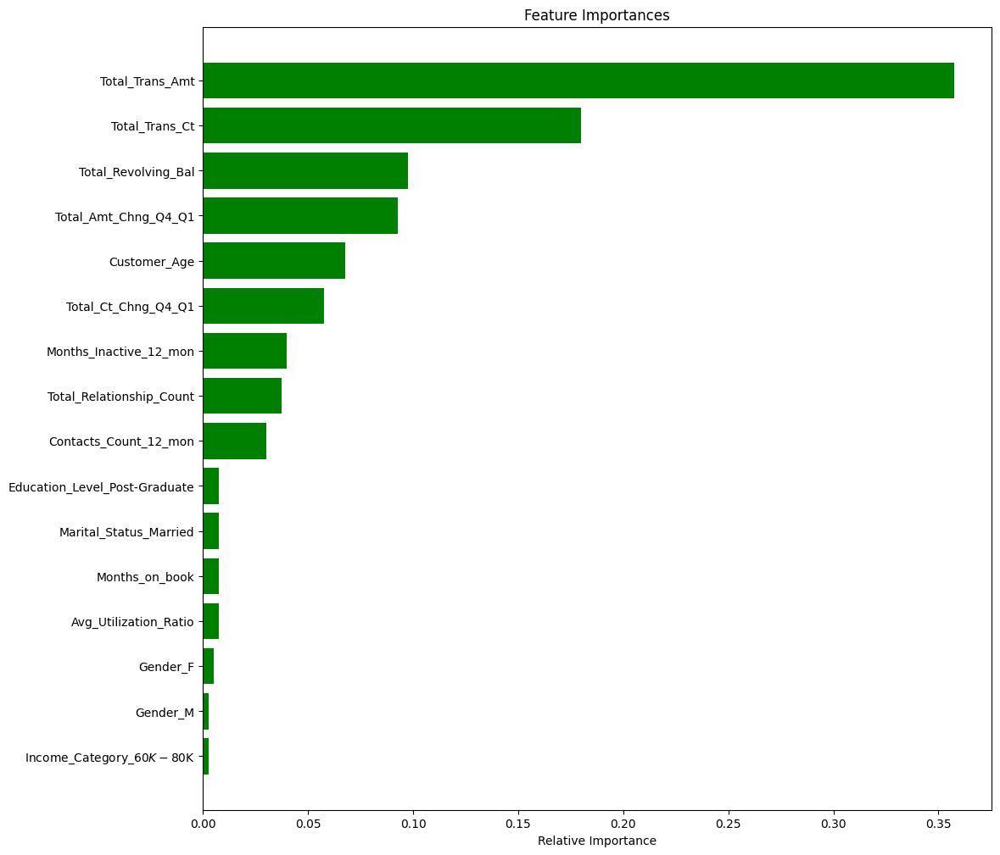

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, RobustScaler
from sklearn.ensemble import AdaBoostClassifier
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import train_test_split

# Load the dataset
df = pd.read_csv("/content/BankChurners.csv")

# Handle missing values in 'Customer_Age'
df['Customer_Age'].fillna(df['Customer_Age'].median(), inplace=True)

# Preprocess the data
df['Income_Category'].replace('Unknown', df['Income_Category'].mode()[0], inplace=True)
X = df.drop(columns=["Attrition_Flag"])
y = df["Attrition_Flag"].map({"Attrited Customer": 1, "Existing Customer": 0})

# Define columns to drop
columns_to_drop = [
    "CLIENTNUM",
    "Credit_Limit",
    "Dependent_count",
    "Months_on_book",
    "Avg_Open_To_Buy",
    "Education_Level",
    "Avg_Utilization_Ratio",
    "Card_Category"
]

# Define preprocessing steps for the pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('drop_columns', 'drop', columns_to_drop),
        ('categorical', OneHotEncoder(handle_unknown='ignore'), ['Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']),
        ('numerical', RobustScaler(), ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'])
    ],
    remainder='passthrough'
)

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Perform random undersampling
rus = RandomUnderSampler(random_state=42)
X_train_under, y_train_under = rus.fit_resample(X_train, y_train)

# Define the best parameters obtained from hyperparameter tuning
best_params = {'n_estimators': 400, 'learning_rate': 0.2}

# Build AdaBoostClassifier model with best parameters
ada_tuned_model = AdaBoostClassifier(**best_params, random_state=0)

# Create the pipeline
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('model', ada_tuned_model)
])

# Fit the pipeline with undersampled data
pipeline.fit(X_train_under, y_train_under)

# Get feature importances from the trained AdaBoost model
importances = pipeline.named_steps['model'].feature_importances_

# Get remaining feature names after dropping specified columns
remaining_feature_names_categorical = pipeline.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(input_features=['Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category'])
remaining_feature_names_numerical = pipeline.named_steps['preprocessor'].transformers_[2][2]
remaining_feature_names = list(remaining_feature_names_categorical) + list(remaining_feature_names_numerical)

# Filter out insignificant features with importance greater than zero
significant_features = [feature for feature, importance in zip(remaining_feature_names, importances) if importance > 0]
importances = [importance for importance in importances if importance > 0]

# Sort features and importances in descending order
sorted_indices = sorted(range(len(importances)), key=lambda i: importances[i], reverse=True)
sorted_features = [significant_features[i] for i in sorted_indices]
sorted_importances = [importances[i] for i in sorted_indices]

# Create a horizontal bar plot to visualize feature importances
plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(sorted_features)), sorted_importances[::-1], color="green", align="center")
plt.yticks(range(len(sorted_features)), sorted_features[::-1])
plt.xlabel("Relative Importance")
plt.show()


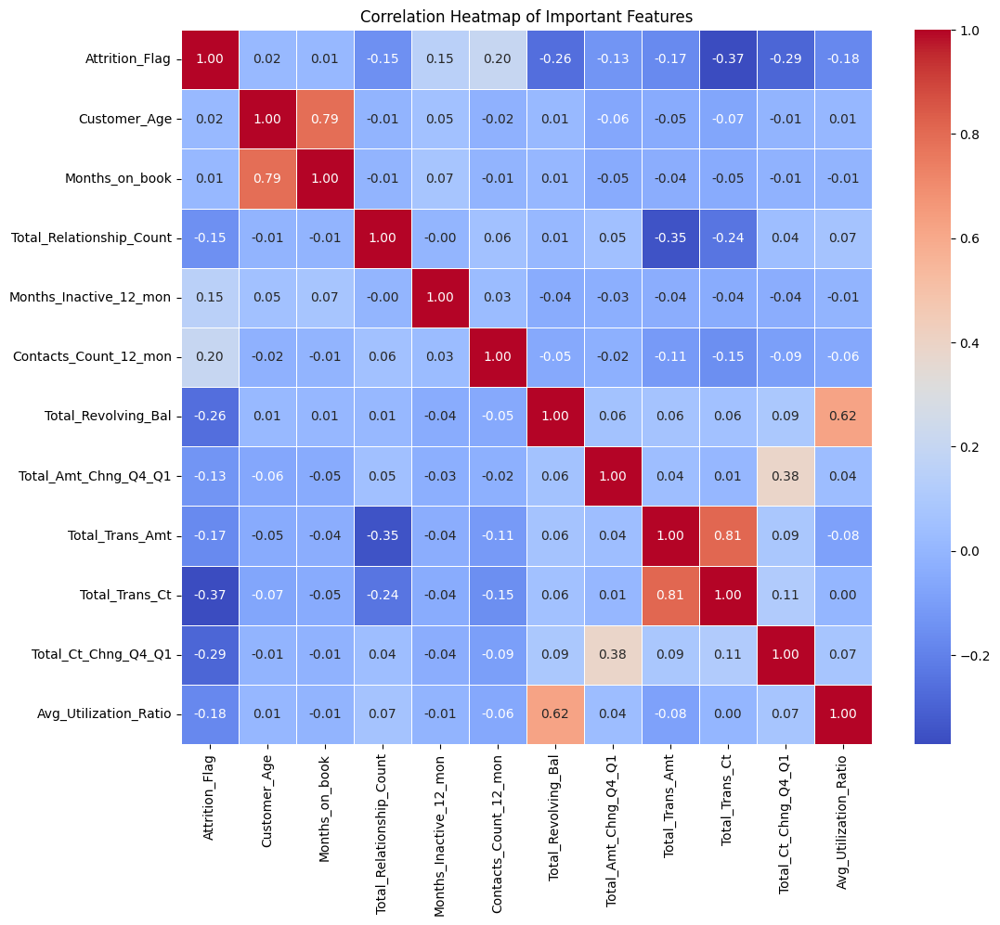

In [ ]:
import seaborn as sns
# Filter the dataframe to include only the important features
important_cols = [col for col in df.columns if col in sorted_features[::-1]]
filtered_df = df[important_cols]

y=df["Attrition_Flag"].map({'Existing Customer':0 , 'Attrited Customer':1})
y_df=pd.DataFrame(y)

combined_df=pd.concat([y_df,filtered_df],axis=1)
combined_df

# Calculate the correlation matrix
corr_matrix = combined_df.corr()

# Plot the correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap of Important Features")
plt.show()


The most important features to understand customer credit card churn are:

Total Transaction Count

Total Transaction Amount

Total Revolving Balance

Total Amount Change Q4 to Q1

Customer Age

Total Count Change Q4 to Q1

Months_Inactive 12_monnth

The negative correlation between the attrition flag and Total Transaction count, Total Revolving Balance, Total Amount Change Q4 to Q1, Total Transaction Amount and average utilization ratio shows that the lower the values of these features, the higher the chances of a customer to attrite.


Bank should connect with the customer more often to increase the connect, and provide the customer with various offers and schemes to increase relationships of the customer with the bank.


Bank should offer cashback schemes on credit cards, which might encourage the customers on using the credit card more often

Any economic activities that can foster total transaction amount as well as the transation count are highly recommendable to suggest the targeted customers. For example, bundling the home loan and auto loan. Encouraging customers to open different types of accounts such as checking account, saving account etc.


Along with the available types of cards, bank can introduce credit cards specific to online shopping (with certain % cashback offers) or online food ordering. This way the card will be used more frequently.


With our model, we can predict which customers are likely to attrite, and according to the predicted probability, at least top 20-30% customers can be reached out to discuss credit card offers, credit limit increase etc, to try retain those customers.

#                                            **Thank you!**